In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

pd.set_option('display.max_columns', None)
sns.set_style('darkgrid')
import matplotlib
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (9, 5)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [3]:
survey_df = pd.read_csv("/content/drive/MyDrive/Servey_Result.csv")
schema_df = pd.read_csv("/content/drive/MyDrive/Questions_.csv")

In [4]:
survey_df.head(3)

,Age,Employment,RemoteWork,EdLevel,LearnCodeCoursesCert,YearsCode,YearsCodePro,DevType,OrgSize,PurchaseInfluence,Country,CompTotal,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSysPersonal use,OpSysProfessional use,OfficeStackAsyncHaveWorkedWith,OfficeStackAsyncWantToWorkWith,OfficeStackSyncHaveWorkedWith,OfficeStackSyncWantToWorkWith,AISearchHaveWorkedWith,AISearchWantToWorkWith,AIDevHaveWorkedWith,AIDevWantToWorkWith,NEWSOSites,SOAccount,AIToolCurrently Using,AIToolNot interested in Using,AISelect,AISent,AIAcc,AIBen,AIToolInterested in Using,TimeSearching,WorkExp,Industry
0,18-24 years old,"Employed, full-time;Student, part-time","Hybrid (some remote, some in-person)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)",NaN,6,NaN,"Developer, embedded applications or devices",NaN,NaN,United States of America,NaN,Bash/Shell (all shells);C;C++;MATLAB;Python,Assembly;Bash/Shell (all shells);C;C++;Lua;Pow...,MariaDB;MySQL;SQLite,PostgreSQL,"Linode, now Akamai","Linode, now Akamai",NaN,NaN,Docker;GNU GCC;Make;QMake,Ansible;Docker;GNU GCC;Make,Atom;Notepad++;Qt Creator;Visual Studio Code,Android Studio;Notepad++;Qt Creator;Visual Stu...,Windows;Windows Subsystem for Linux (WSL),Windows;Windows Subsystem for Linux (WSL),Jira;Markdown File,Jira;Markdown File,Microsoft Teams,Microsoft Teams,NaN,NaN,NaN,NaN,Stack Overflow;Stack Exchange;Collectives on S...,Yes,NaN,NaN,"No, and I don't plan to",NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,25-34 years old,"Employed, full-time","Hybrid (some remote, some in-person)","Secondary school (e.g. American high school, G...",NaN,14,12,"Developer, full-stack",20 to 99 employees,I have a great deal of influence,United Kingdom of Great Britain and Northern I...,75000.0,Bash/Shell (all shells);HTML/CSS;Java;JavaScri...,Bash/Shell (all shells);HTML/CSS;Rust;SQL;Type...,MariaDB;MySQL;PostgreSQL;SQLite,MariaDB;PostgreSQL;SQLite,Amazon Web Services (AWS);Cloudflare;Google Cl...,Hetzner,Laravel;NestJS;Next.js;Node.js;React,Deno;NestJS;Next.js;Node.js;React,Cargo;CMake;Docker;Make;npm;Pip;Yarn,Cargo;Docker;npm;Yarn,Nano;Neovim;Visual Studio Code,Neovim;Visual Studio Code,Other Linux-based,Other Linux-based,GitHub Discussions;Markdown File;Notion;Wikis,GitHub Discussions;Markdown File;Notion;Wikis,Google Meet;Microsoft Teams;Whatsapp;Zoom,NaN,Bing AI;ChatGPT;WolframAlpha,WolframAlpha,NaN,NaN,Stack Overflow;Stack Exchange,Not sure/can't remember,NaN,NaN,"No, and I don't plan to",NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,35-44 years old,"Employed, full-time","Hybrid (some remote, some in-person)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)",NaN,32,24,"Senior Executive (C-Suite, VP, etc.)",20 to 99 employees,I have a great deal of influence,United States of America,225000.0,C#;Go;HTML/CSS;JavaScript;Lisp;Rust;SQL;TypeSc...,C#;Clojure;Elixir;HTML/CSS;JavaScript;Rust;Typ...,Cosmos DB;Couch DB;Firebase Realtime Database;...,Couch DB;Neo4J;PostgreSQL,Amazon Web Services (AWS);Heroku;Vercel,Amazon Web Services (AWS);Fly.io;IBM Cloud Or ...,Angular;ASP.NET CORE;Express;NestJS;Next.js;No...,ASP.NET CORE;Express;NestJS;Node.js;React;Remi...,Docker;Kubernetes;npm;NuGet;Webpack;Yarn,Docker;Kubernetes;npm;NuGet,Android Studio;Eclipse;Nano;Notepad++;Sublime ...,Sublime Text;Visual Studio Code,MacOS,MacOS,Azure Devops;Confluence;Jira;Miro,Miro,Google Chat;Google Meet;Zoom,Zoom,ChatGPT;Google Bard AI;WolframAlpha,ChatGPT;WolframAlpha,GitHub Copilot;Tabnine,GitHub Copilot;Tabnine,Stack Overflow;Stack Exchange,Yes,NaN,NaN,"No, but I plan to soon",Favorable,NaN,Somewhat distrust,NaN,30-60 minutes a day,21.0,"Information Services, IT, Software Development..."


In [5]:
survey_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25000 entries, 0 to 24999
Data columns (total 46 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Age                             25000 non-null  object 
 1   Employment                      24640 non-null  object 
 2   RemoteWork                      20661 non-null  object 
 3   EdLevel                         24665 non-null  object 
 4   LearnCodeCoursesCert            10380 non-null  object 
 5   YearsCode                       24493 non-null  object 
 6   YearsCodePro                    18480 non-null  object 
 7   DevType                         21507 non-null  object 
 8   OrgSize                         18200 non-null  object 
 9   PurchaseInfluence               18179 non-null  object 
 10  Country                         24665 non-null  object 
 11  CompTotal                       13489 non-null  float64
 12  LanguageHaveWorkedWith          

In [6]:
def filter_YearsCode(row):
  if row=='Less than 1 year':
    return 1
  elif row=='More than 50 years':
    return 50
  else:
    return row

In [7]:
survey_df['YearsCode'] = survey_df['YearsCode'].apply(filter_YearsCode)
survey_df['YearsCode'] = survey_df['YearsCode'].fillna(60).astype(int)

In [8]:
survey_df['YearsCodePro'] = survey_df['YearsCodePro'].apply(filter_YearsCode)
survey_df['YearsCodePro'] = survey_df['YearsCodePro'].fillna(60).astype(int)

In [9]:
survey_df['WorkExp'].fillna(60, inplace=True)

# Single Column Analysis

In [10]:
Employment_df = survey_df['Employment'].value_counts().head(15)

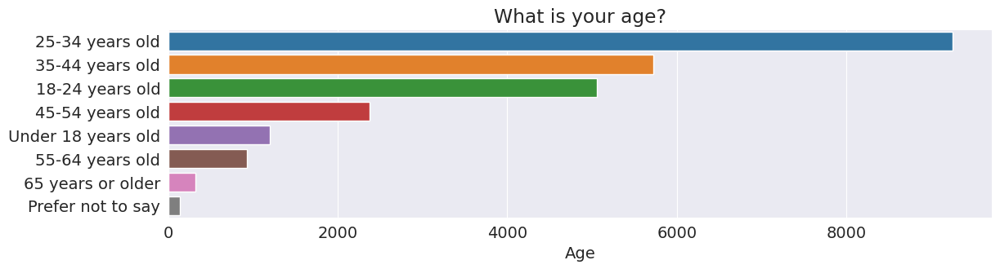

In [11]:
age_df = survey_df['Age'].value_counts()
plt.figure(figsize=(13, 3))
plt.xticks(rotation=0)
plt.title("What is your age?")
sns.barplot(x=age_df, y=age_df.index);

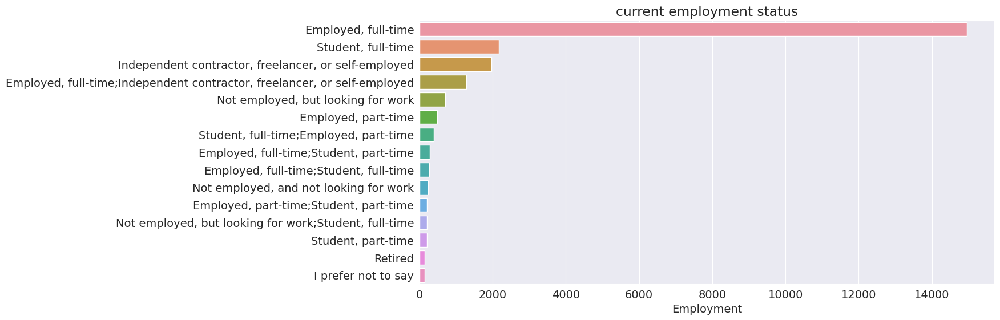

In [12]:
Employment_df = survey_df['Employment'].value_counts().head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("current employment status")
sns.barplot(x=Employment_df, y=Employment_df.index);

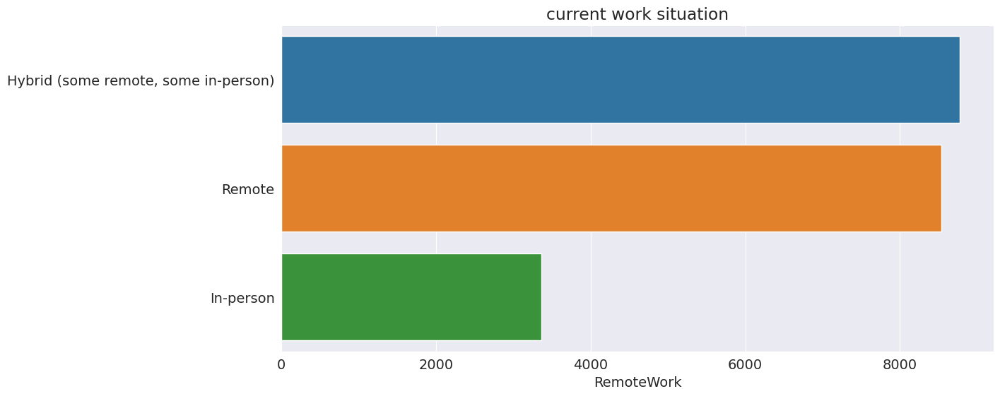

In [13]:
RemoteWork_df = survey_df['RemoteWork'].value_counts()
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("current work situation")
sns.barplot(x=RemoteWork_df, y=RemoteWork_df.index);

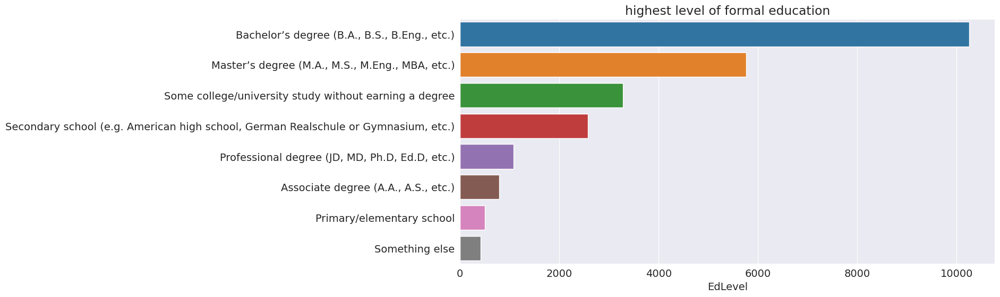

In [14]:
EdLevel = survey_df['EdLevel'].value_counts()
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("highest level of formal education")
sns.barplot(x=EdLevel, y=EdLevel.index);

In [15]:
def split_multicolumn(col_series):
  result_df = col_series.to_frame()
  options = []
  for idx, value in col_series[col_series.notnull()].items():
    for option in value.split(';'):
      if not option in result_df.columns:
        options.append(option)
        result_df[option] = False
      result_df.at[idx, option] = True
  return result_df[options]

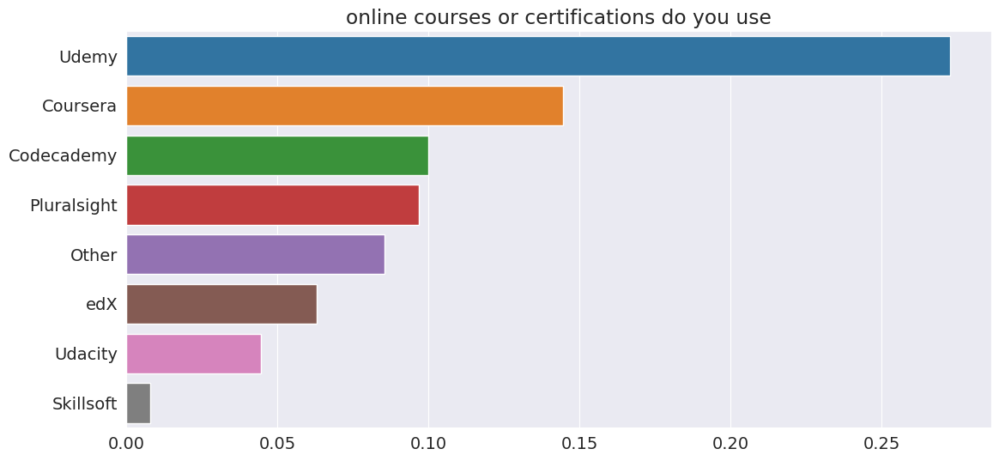

In [16]:
LearnCodeCoursesCert = split_multicolumn(survey_df['LearnCodeCoursesCert'])
LearnCodeCoursesCert = LearnCodeCoursesCert.mean().sort_values(ascending=False)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("online courses or certifications do you use")
sns.barplot(x=LearnCodeCoursesCert, y=LearnCodeCoursesCert.index);

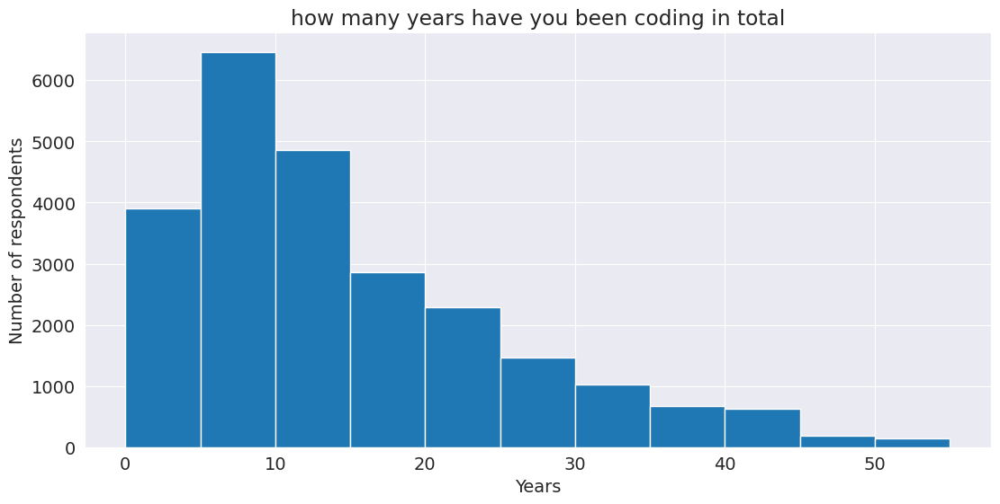

In [17]:
plt.figure(figsize=(13, 6))
plt.title('how many years have you been coding in total')
plt.xlabel("Years")
plt.ylabel("Number of respondents")
plt.hist(survey_df['YearsCode'], bins=np.arange(0, 60, 5));

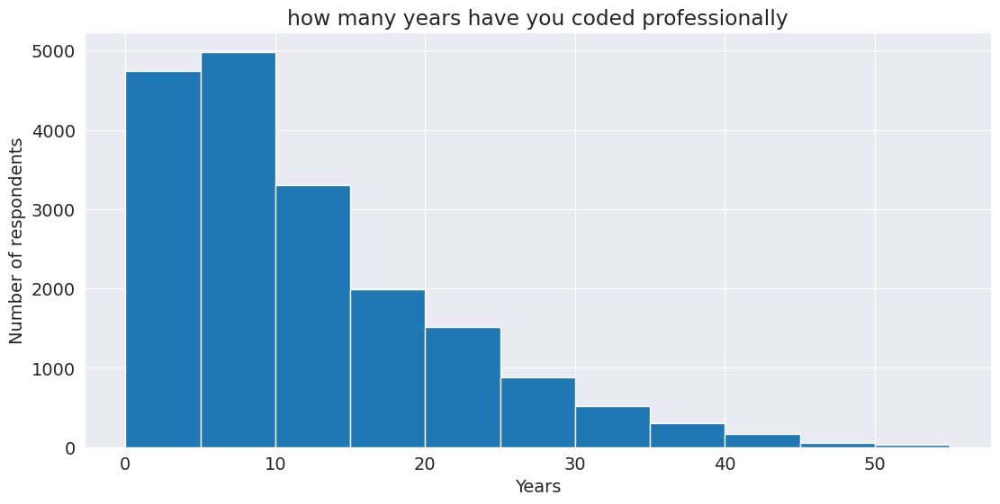

In [18]:
plt.figure(figsize=(13, 6))
plt.title('how many years have you coded professionally')
plt.xlabel("Years")
plt.ylabel("Number of respondents")
plt.hist(survey_df['YearsCodePro'], bins=np.arange(0, 60, 5));

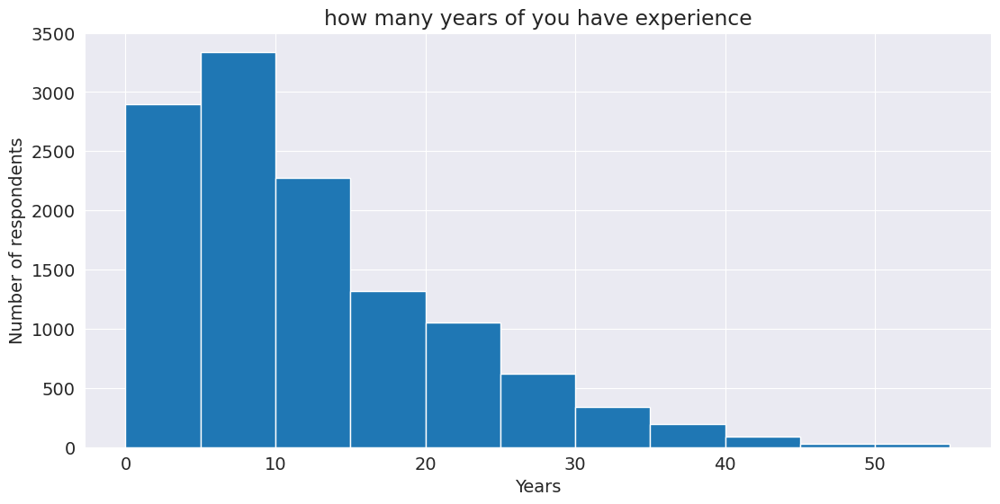

In [19]:
plt.figure(figsize=(13, 6))
plt.title('how many years of you have experience')
plt.xlabel("Years")
plt.ylabel("Number of respondents")
plt.hist(survey_df['WorkExp'], bins=np.arange(0, 60, 5));

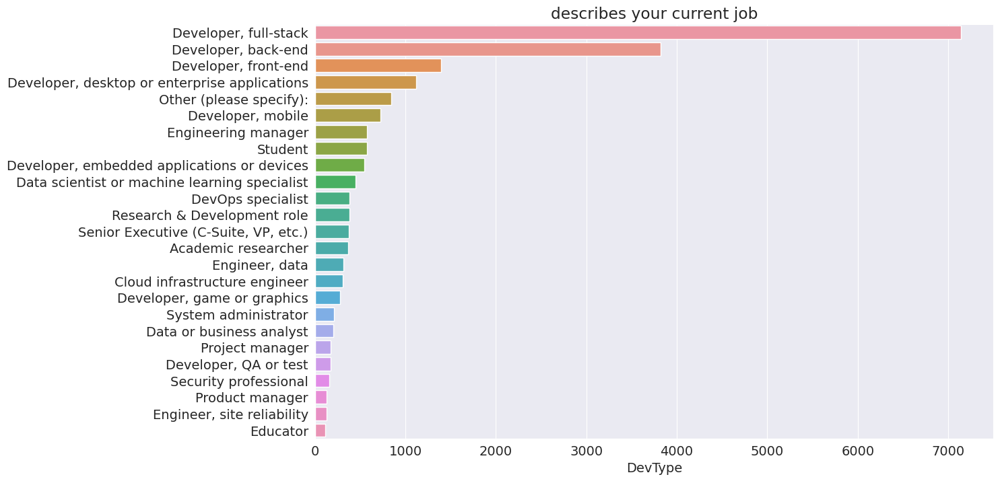

In [20]:
DevType = survey_df['DevType'].value_counts().head(25)
plt.figure(figsize=(13, 8))
plt.xticks(rotation=0)
plt.title("describes your current job")
sns.barplot(x=DevType, y=DevType.index);

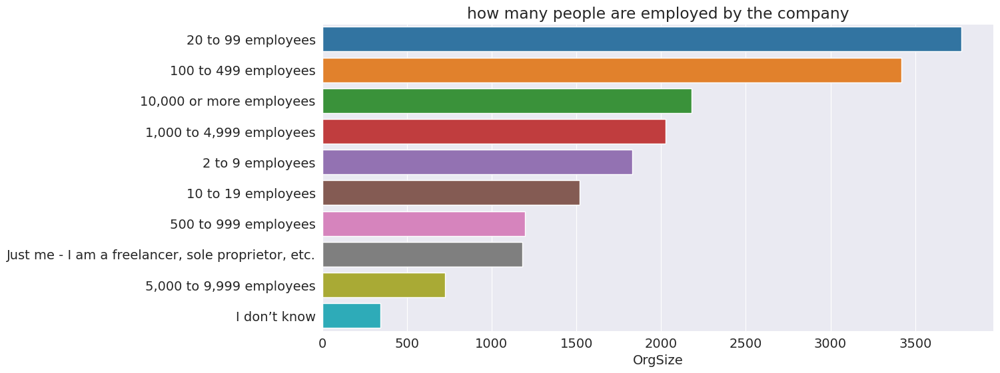

In [21]:
OrgSize = survey_df['OrgSize'].value_counts()
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("how many people are employed by the company")
sns.barplot(x=OrgSize, y=OrgSize.index);

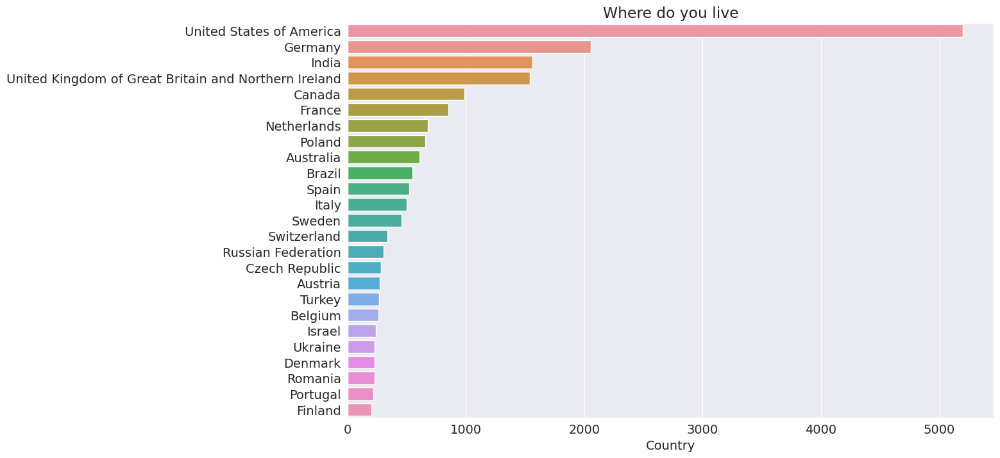

In [22]:
Country = survey_df['Country'].value_counts().head(25)
plt.figure(figsize=(13, 8))
plt.xticks(rotation=0)
plt.title("Where do you live")
sns.barplot(x=Country, y=Country.index);

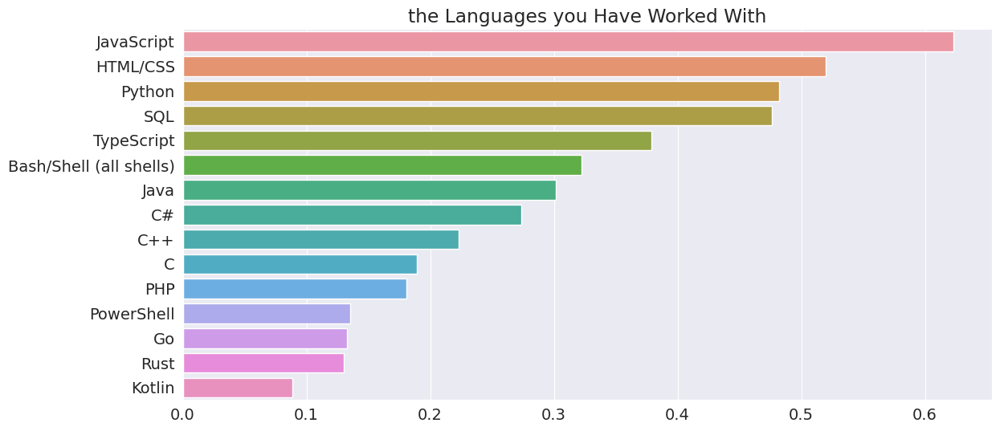

In [23]:
LanguageHaveWorkedWith_df = split_multicolumn(survey_df['LanguageHaveWorkedWith'])
LanguageHaveWorkedWith_per = LanguageHaveWorkedWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Languages you Have Worked With")
sns.barplot(x=LanguageHaveWorkedWith_per, y=LanguageHaveWorkedWith_per.index);

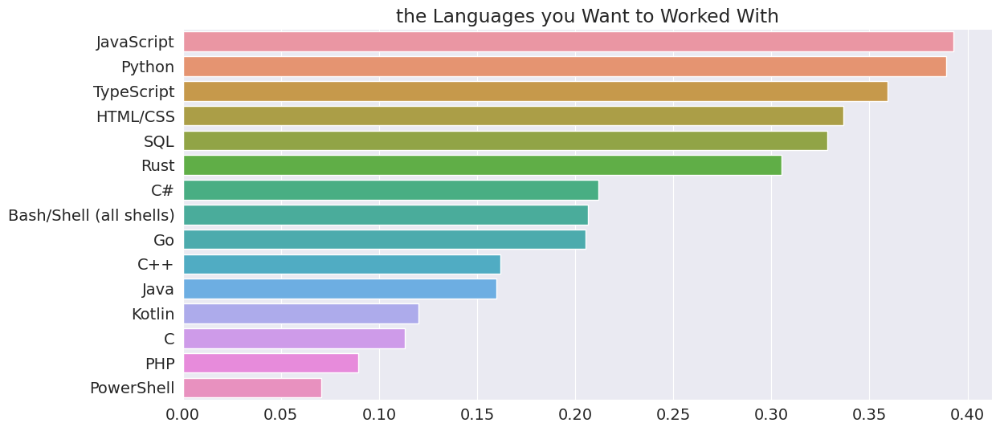

In [24]:
LanguageWantToWorkWith_df = split_multicolumn(survey_df['LanguageWantToWorkWith'])
LanguageWantToWorkWith_per = LanguageWantToWorkWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Languages you Want to Worked With")
sns.barplot(x=LanguageWantToWorkWith_per, y=LanguageWantToWorkWith_per.index);

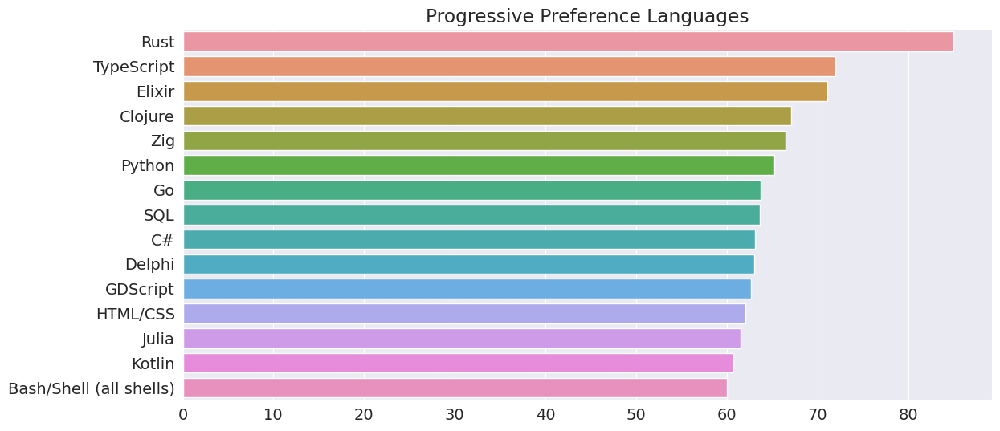

In [25]:
ProgressivePreferenceLanguages_df = LanguageHaveWorkedWith_df & LanguageWantToWorkWith_df
ProgressivePreferenceLanguages_per = (ProgressivePreferenceLanguages_df.sum() * 100 / LanguageHaveWorkedWith_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference Languages")
sns.barplot(x=ProgressivePreferenceLanguages_per, y=ProgressivePreferenceLanguages_per.index);

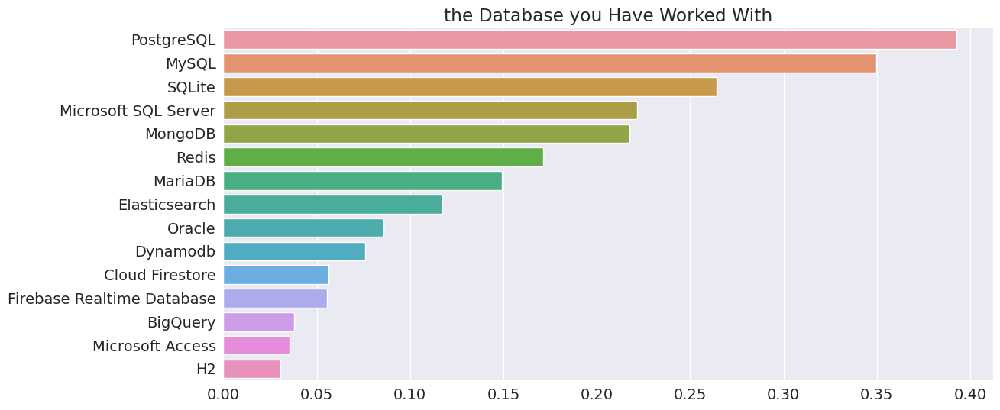

In [26]:
DatabaseHaveWorkedWith_df = split_multicolumn(survey_df['DatabaseHaveWorkedWith'])
DatabaseHaveWorkedWith_per = DatabaseHaveWorkedWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Database you Have Worked With")
sns.barplot(x=DatabaseHaveWorkedWith_per, y=DatabaseHaveWorkedWith_per.index);

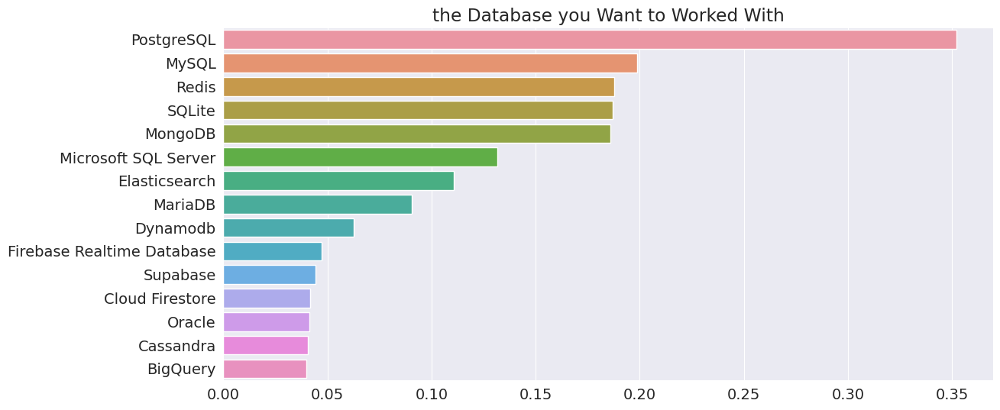

In [27]:
DatabaseWantToWorkWith_df = split_multicolumn(survey_df['DatabaseWantToWorkWith'])
DatabaseWantToWorkWith_per = DatabaseWantToWorkWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Database you Want to Worked With")
sns.barplot(x=DatabaseWantToWorkWith_per, y=DatabaseWantToWorkWith_per.index);

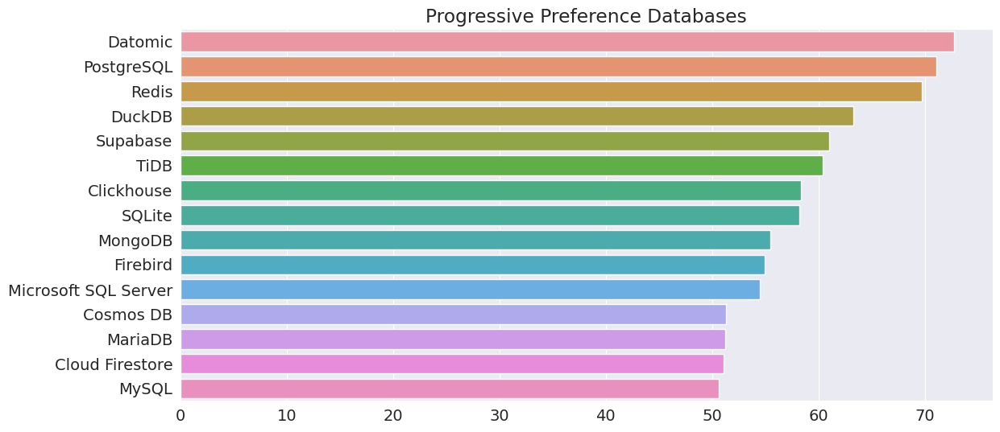

In [28]:
ProgressivePreferencedatabases_df = DatabaseHaveWorkedWith_df & DatabaseWantToWorkWith_df
ProgressivePreferencedatabases_per = (ProgressivePreferencedatabases_df.sum() * 100 / DatabaseHaveWorkedWith_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference Databases")
sns.barplot(x=ProgressivePreferencedatabases_per, y=ProgressivePreferencedatabases_per.index);

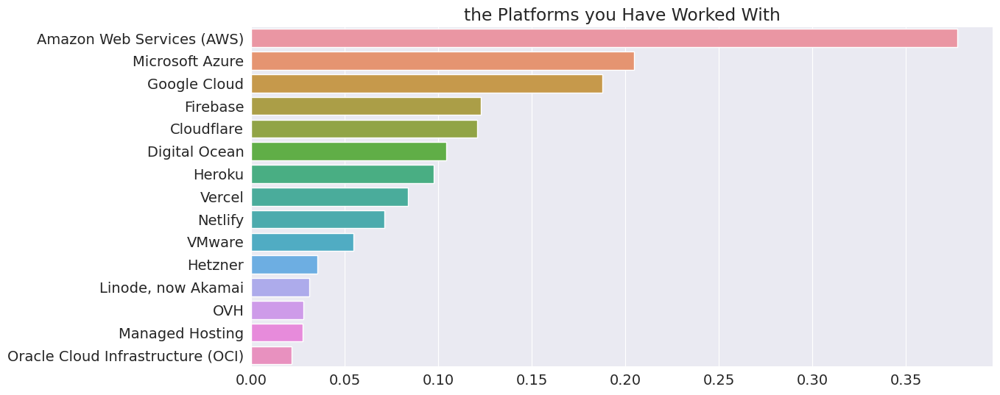

In [29]:
PlatformHaveWorkedWith_df = split_multicolumn(survey_df['PlatformHaveWorkedWith'])
PlatformHaveWorkedWith_per = PlatformHaveWorkedWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Platforms you Have Worked With")
sns.barplot(x=PlatformHaveWorkedWith_per, y=PlatformHaveWorkedWith_per.index);

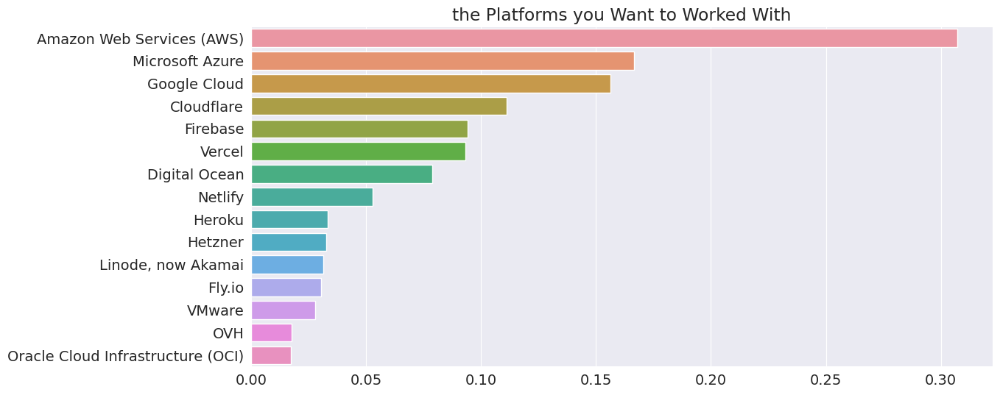

In [30]:
PlatformWantToWorkWith_df = split_multicolumn(survey_df['PlatformWantToWorkWith'])
PlatformWantToWorkWith_per = PlatformWantToWorkWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Platforms you Want to Worked With")
sns.barplot(x=PlatformWantToWorkWith_per, y=PlatformWantToWorkWith_per.index);

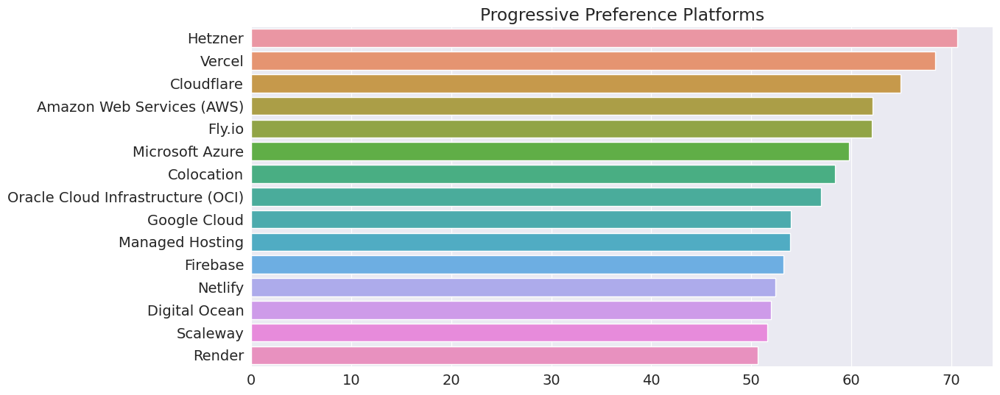

In [31]:
ProgressivePreferencePlatform_df = PlatformHaveWorkedWith_df & PlatformWantToWorkWith_df
ProgressivePreferencePlatform_per = (ProgressivePreferencePlatform_df.sum() * 100 / PlatformHaveWorkedWith_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference Platforms")
sns.barplot(x=ProgressivePreferencePlatform_per, y=ProgressivePreferencePlatform_per.index);

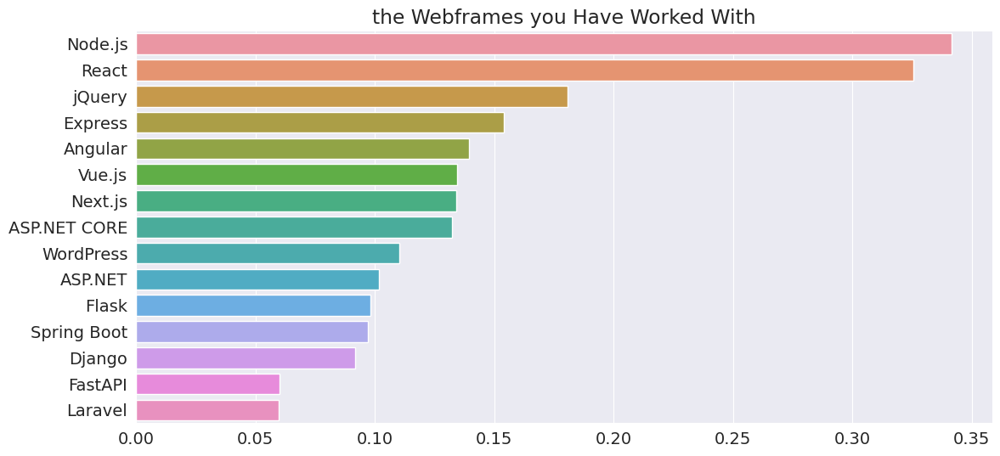

In [32]:
WebframeHaveWorkedWith_df = split_multicolumn(survey_df['WebframeHaveWorkedWith'])
WebframeHaveWorkedWith_per = WebframeHaveWorkedWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Webframes you Have Worked With")
sns.barplot(x=WebframeHaveWorkedWith_per, y=WebframeHaveWorkedWith_per.index);

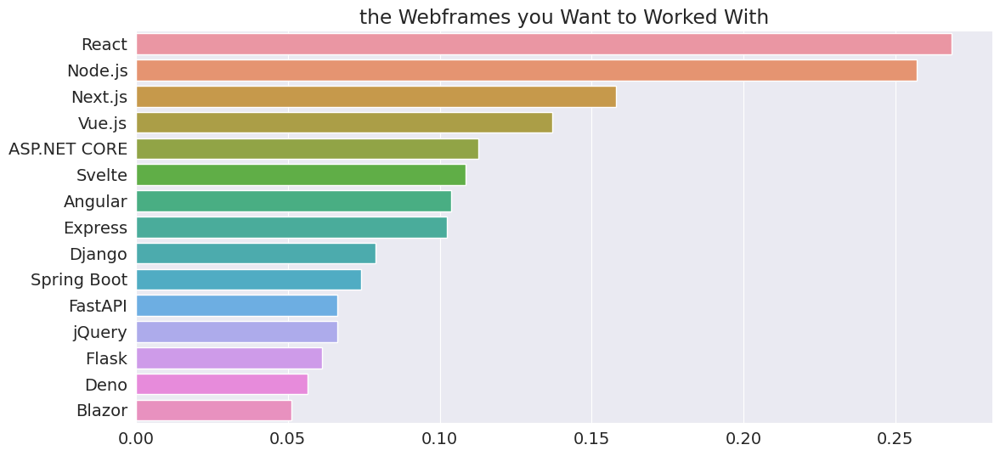

In [33]:
WebframeWantToWorkWith_df = split_multicolumn(survey_df['WebframeWantToWorkWith'])
WebframeWantToWorkWith_per = WebframeWantToWorkWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Webframes you Want to Worked With")
sns.barplot(x=WebframeWantToWorkWith_per, y=WebframeWantToWorkWith_per.index);

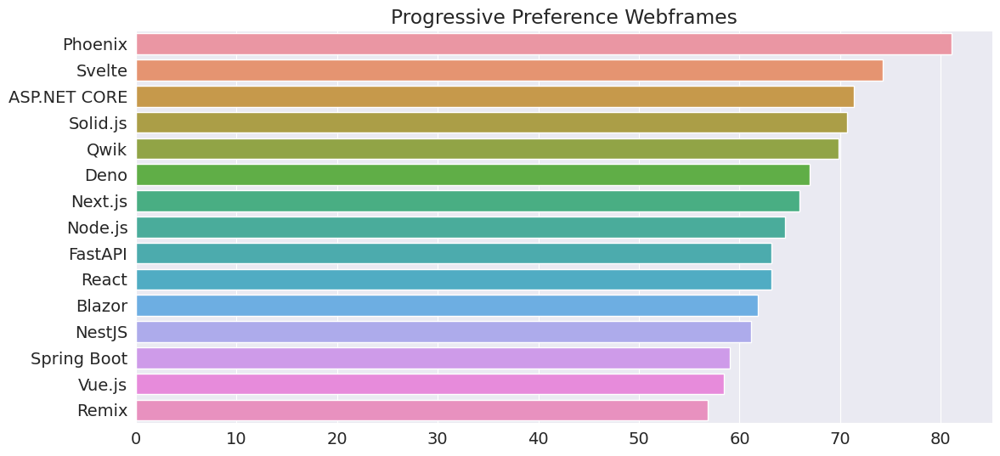

In [34]:
ProgressivePreferenceWebframes_df = WebframeHaveWorkedWith_df & WebframeWantToWorkWith_df
ProgressivePreferenceWebframes_per = (ProgressivePreferenceWebframes_df.sum() * 100 / WebframeHaveWorkedWith_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference Webframes")
sns.barplot(x=ProgressivePreferenceWebframes_per, y=ProgressivePreferenceWebframes_per.index);

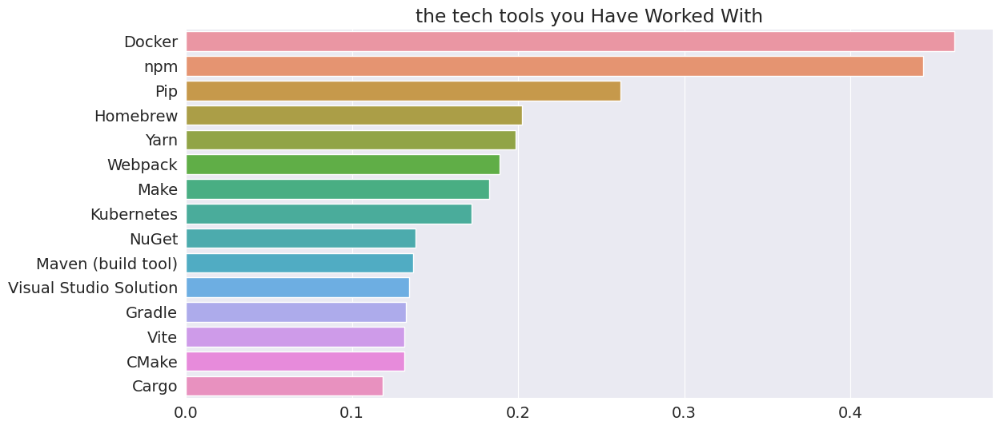

In [35]:
ToolsTechHaveWorkedWith_df = split_multicolumn(survey_df['ToolsTechHaveWorkedWith'])
ToolsTechHaveWorkedWith_per = ToolsTechHaveWorkedWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the tech tools you Have Worked With")
sns.barplot(x=ToolsTechHaveWorkedWith_per, y=ToolsTechHaveWorkedWith_per.index);

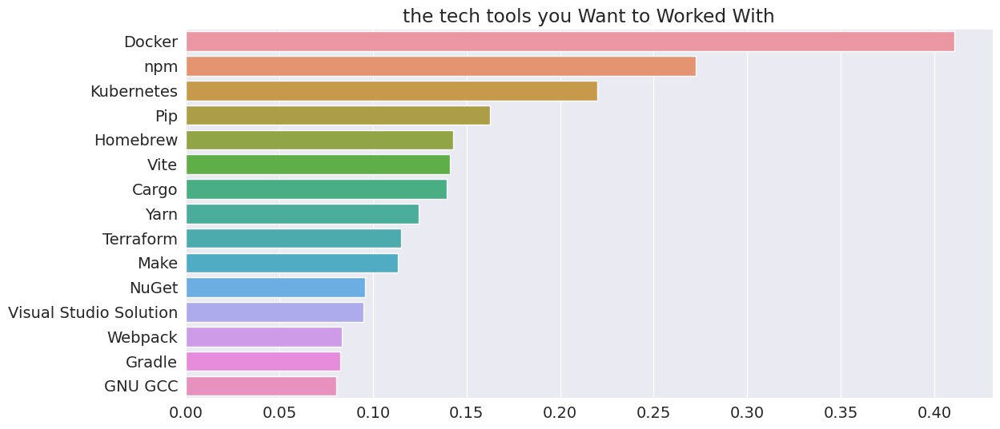

In [36]:
ToolsTechWantToWorkWith_df = split_multicolumn(survey_df['ToolsTechWantToWorkWith'])
ToolsTechWantToWorkWith_per = ToolsTechWantToWorkWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the tech tools you Want to Worked With")
sns.barplot(x=ToolsTechWantToWorkWith_per, y=ToolsTechWantToWorkWith_per.index);

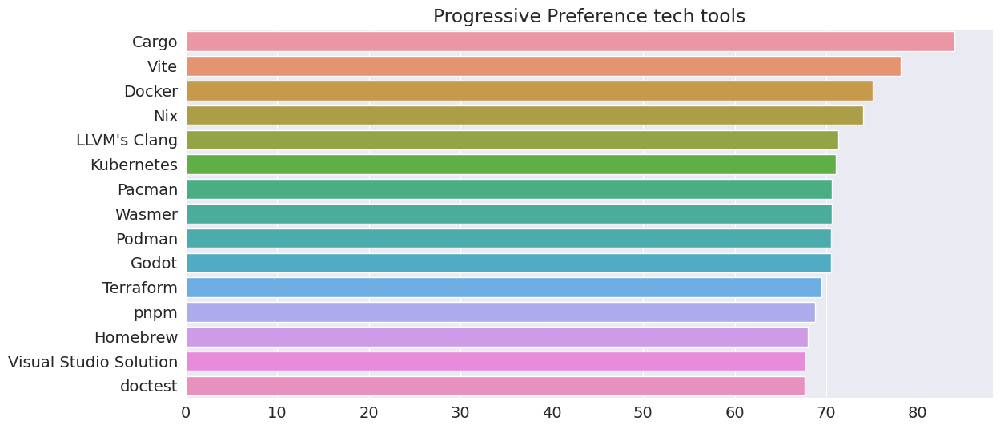

In [37]:
ProgressivePreferenceToolsTech_df = ToolsTechHaveWorkedWith_df & ToolsTechWantToWorkWith_df
ProgressivePreferenceToolsTech_per = (ProgressivePreferenceToolsTech_df.sum() * 100 / ToolsTechHaveWorkedWith_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference tech tools")
sns.barplot(x=ProgressivePreferenceToolsTech_per, y=ProgressivePreferenceToolsTech_per.index);

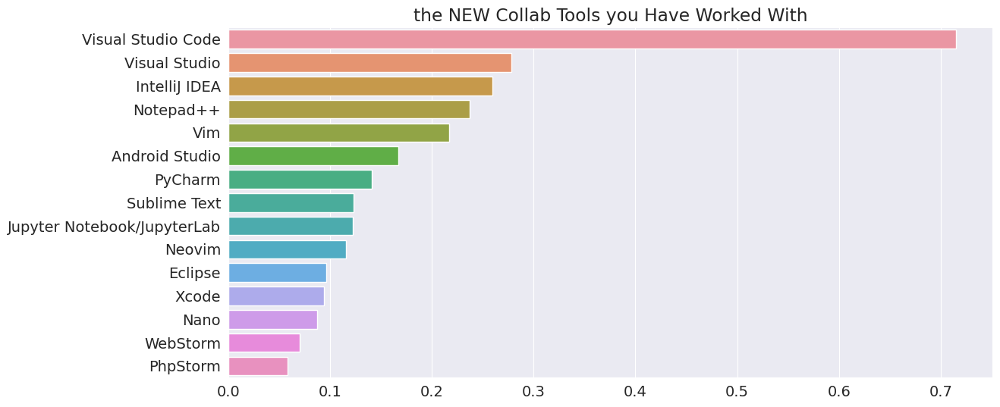

In [38]:
NEWCollabToolsHaveWorkedWith_df = split_multicolumn(survey_df['NEWCollabToolsHaveWorkedWith'])
NEWCollabToolsHaveWorkedWith_per = NEWCollabToolsHaveWorkedWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the NEW Collab Tools you Have Worked With")
sns.barplot(x=NEWCollabToolsHaveWorkedWith_per, y=NEWCollabToolsHaveWorkedWith_per.index);

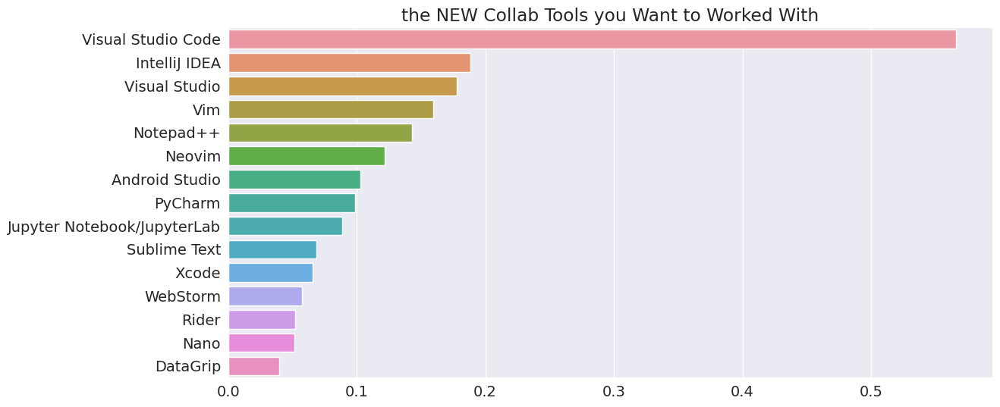

In [39]:
NEWCollabToolsWantToWorkWith_df = split_multicolumn(survey_df['NEWCollabToolsWantToWorkWith'])
NEWCollabToolsWantToWorkWith_per = NEWCollabToolsWantToWorkWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the NEW Collab Tools you Want to Worked With")
sns.barplot(x=NEWCollabToolsWantToWorkWith_per, y=NEWCollabToolsWantToWorkWith_per.index);

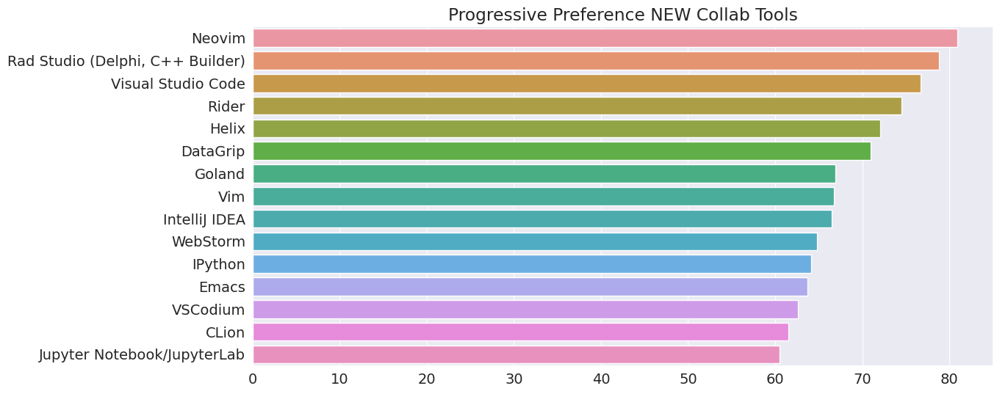

In [40]:
ProgressivePreferenceNEWCollabTools_df = NEWCollabToolsHaveWorkedWith_df & NEWCollabToolsWantToWorkWith_df
ProgressivePreferenceNEWCollabTools_per = (ProgressivePreferenceNEWCollabTools_df.sum() * 100 / NEWCollabToolsHaveWorkedWith_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference NEW Collab Tools")
sns.barplot(x=ProgressivePreferenceNEWCollabTools_per, y=ProgressivePreferenceNEWCollabTools_per.index);

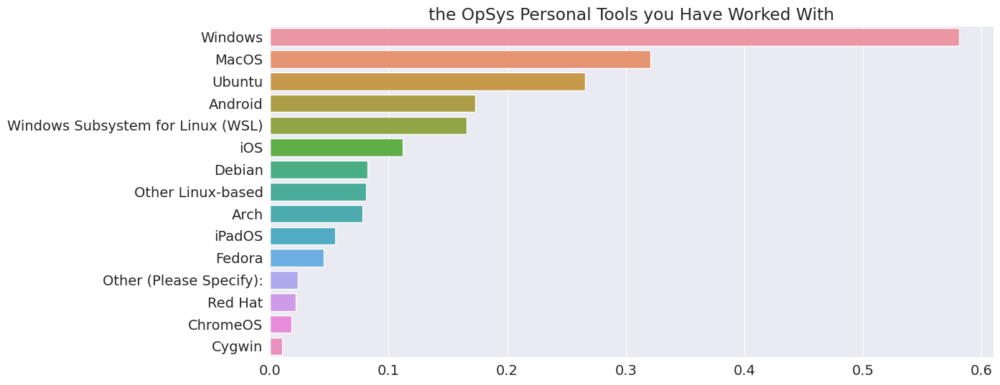

In [41]:
OpSysPersonal_use_df = split_multicolumn(survey_df['OpSysPersonal use'])
OpSysPersonal_use_per = OpSysPersonal_use_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the OpSys Personal Tools you Have Worked With")
sns.barplot(x=OpSysPersonal_use_per, y=OpSysPersonal_use_per.index);

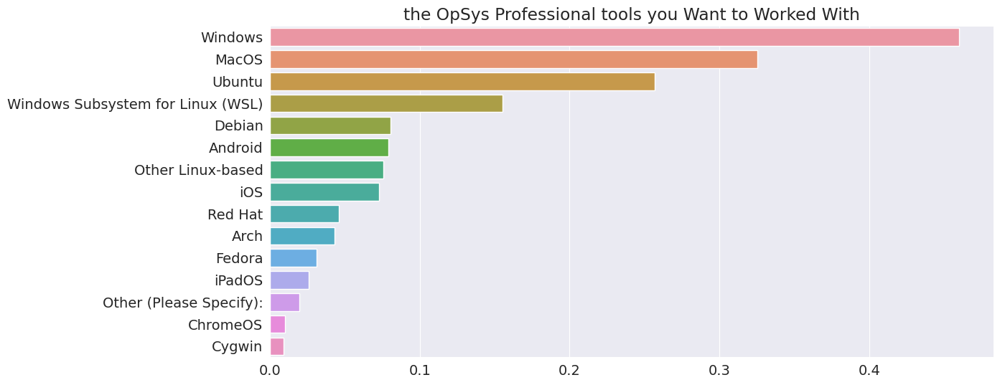

In [42]:
OpSysProfessional_use_df = split_multicolumn(survey_df['OpSysProfessional use'])
OpSysProfessional_use_per = OpSysProfessional_use_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the OpSys Professional tools you Want to Worked With")
sns.barplot(x=OpSysProfessional_use_per, y=OpSysProfessional_use_per.index);

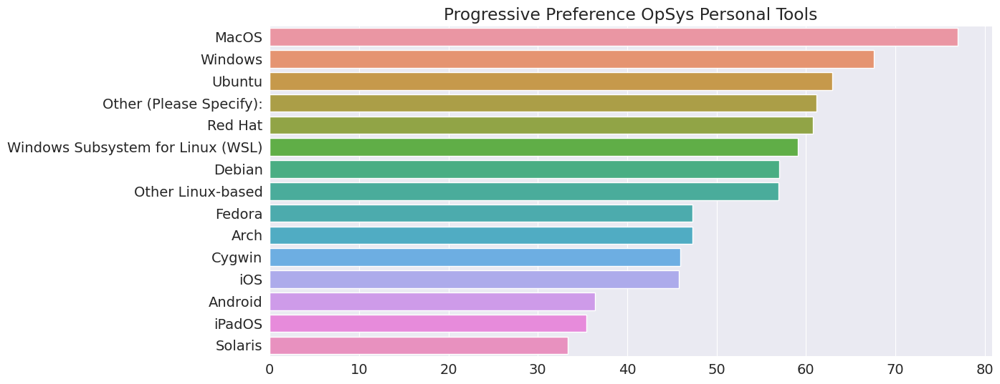

In [43]:
ProgressivePreferenceOpSys_df = OpSysPersonal_use_df & OpSysProfessional_use_df
ProgressivePreferenceOpSys_per = (ProgressivePreferenceOpSys_df.sum() * 100 / OpSysPersonal_use_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference OpSys Personal Tools")
sns.barplot(x=ProgressivePreferenceOpSys_per, y=ProgressivePreferenceOpSys_per.index);

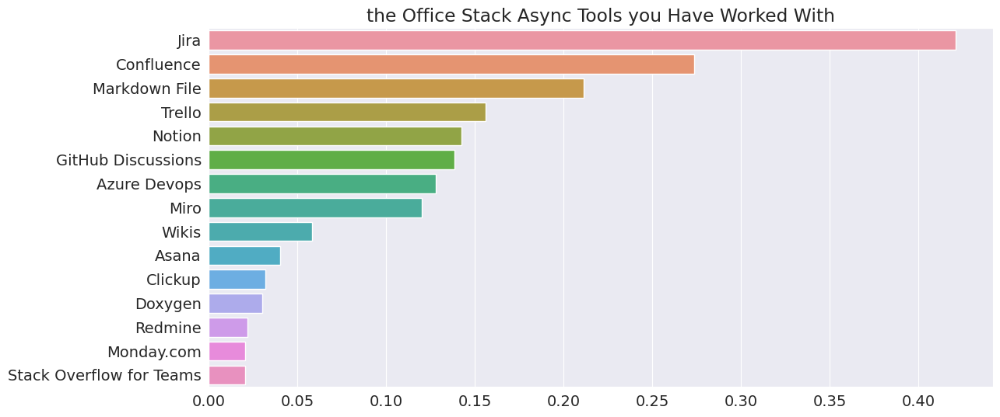

In [44]:
OfficeStackAsyncHaveWorkedWith_df = split_multicolumn(survey_df['OfficeStackAsyncHaveWorkedWith'])
OfficeStackAsyncHaveWorkedWith_per = OfficeStackAsyncHaveWorkedWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Office Stack Async Tools you Have Worked With")
sns.barplot(x=OfficeStackAsyncHaveWorkedWith_per, y=OfficeStackAsyncHaveWorkedWith_per.index);

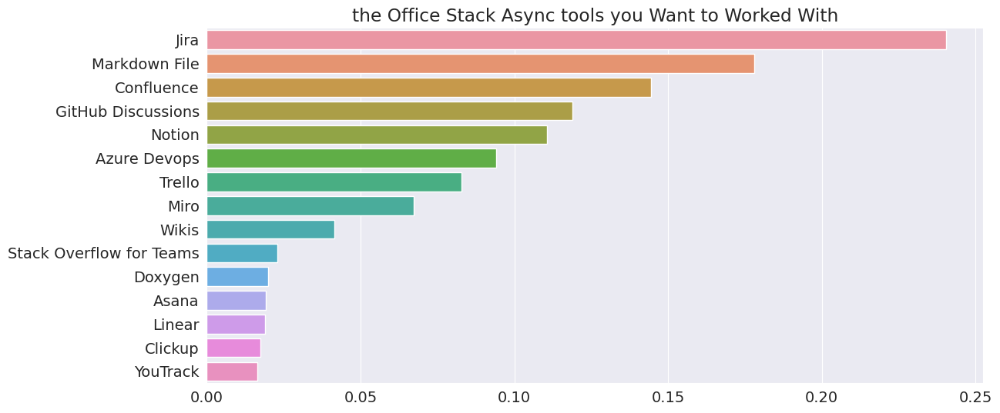

In [45]:
OfficeStackAsyncWantToWorkWith_df = split_multicolumn(survey_df['OfficeStackAsyncWantToWorkWith'])
OfficeStackAsyncWantToWorkWith_per = OfficeStackAsyncWantToWorkWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Office Stack Async tools you Want to Worked With")
sns.barplot(x=OfficeStackAsyncWantToWorkWith_per, y=OfficeStackAsyncWantToWorkWith_per.index);

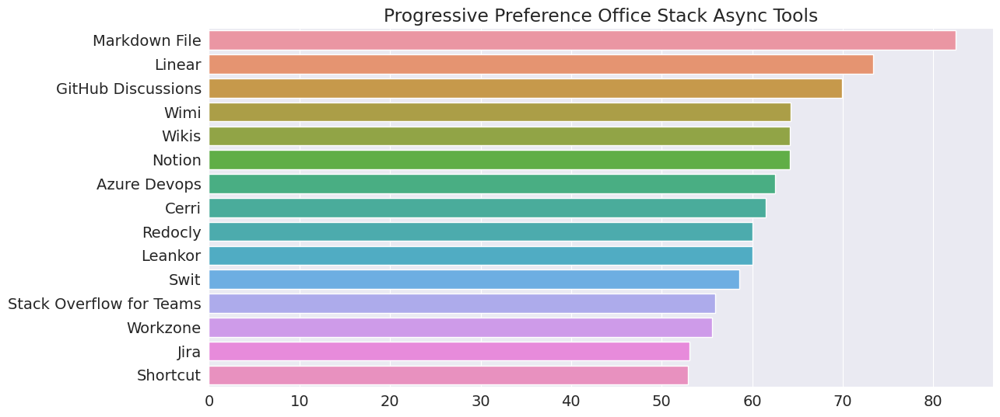

In [46]:
ProgressivePreferenceOfficeStackAsync_df = OfficeStackAsyncHaveWorkedWith_df & OfficeStackAsyncWantToWorkWith_df
ProgressivePreferenceOfficeStackAsync_per = (ProgressivePreferenceOfficeStackAsync_df.sum() * 100 / OfficeStackAsyncHaveWorkedWith_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference Office Stack Async Tools")
sns.barplot(x=ProgressivePreferenceOfficeStackAsync_per, y=ProgressivePreferenceOfficeStackAsync_per.index);

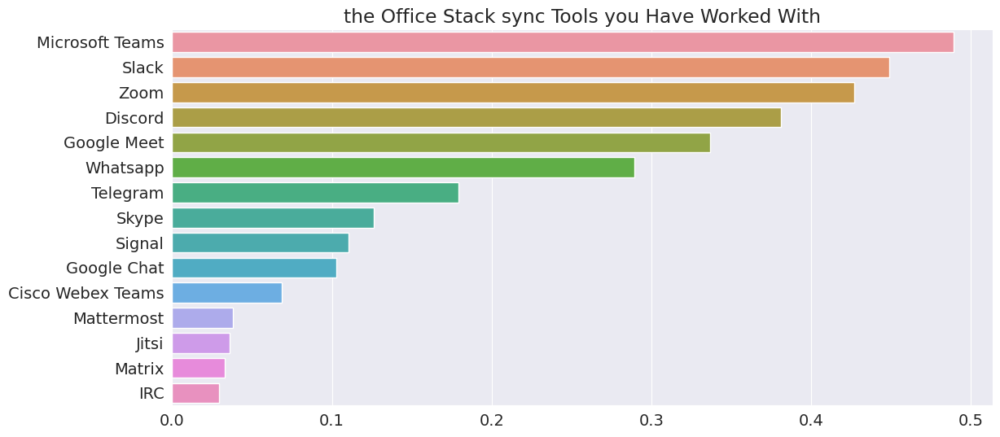

In [47]:
OfficeStackSyncHaveWorkedWith_df = split_multicolumn(survey_df['OfficeStackSyncHaveWorkedWith'])
OfficeStackSyncHaveWorkedWith_per = OfficeStackSyncHaveWorkedWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Office Stack sync Tools you Have Worked With")
sns.barplot(x=OfficeStackSyncHaveWorkedWith_per, y=OfficeStackSyncHaveWorkedWith_per.index);

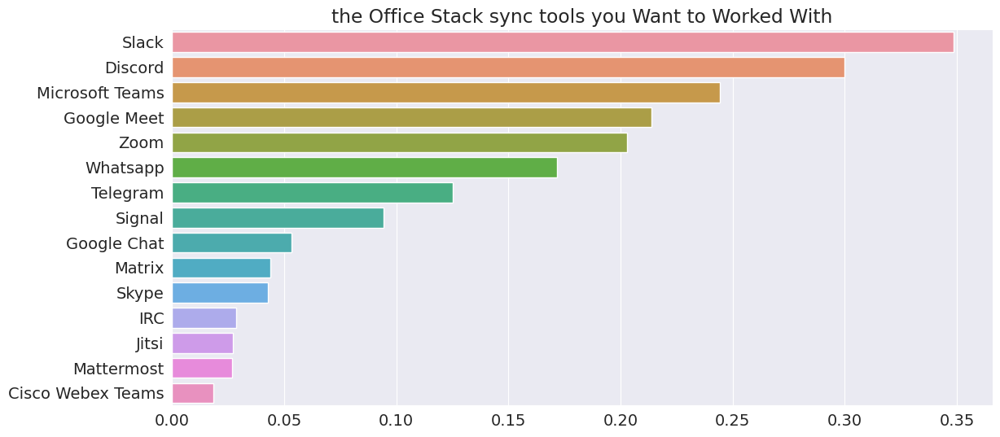

In [48]:
OfficeStackSyncWantToWorkWith_df = split_multicolumn(survey_df['OfficeStackSyncWantToWorkWith'])
OfficeStackSyncWantToWorkWith_per = OfficeStackSyncWantToWorkWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the Office Stack sync tools you Want to Worked With")
sns.barplot(x=OfficeStackSyncWantToWorkWith_per, y=OfficeStackSyncWantToWorkWith_per.index);

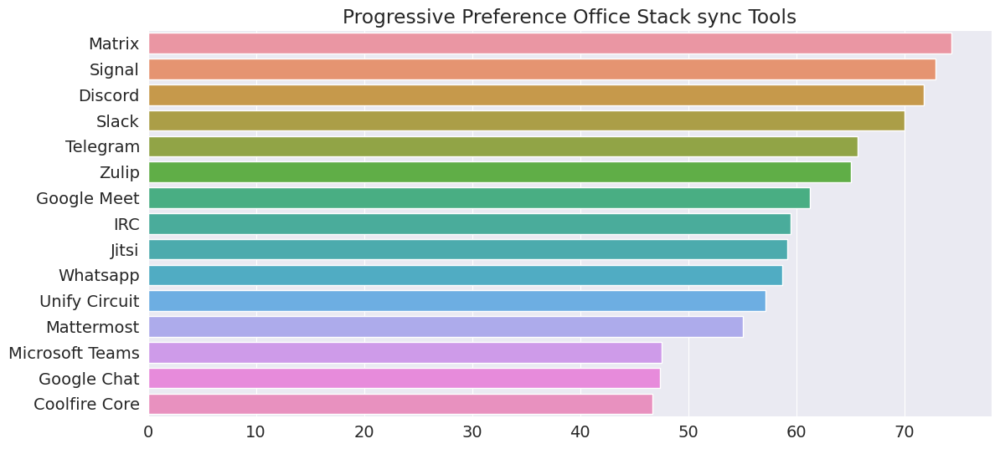

In [49]:
ProgressivePreferenceOfficeStackSync_df = OfficeStackSyncHaveWorkedWith_df & OfficeStackSyncWantToWorkWith_df
ProgressivePreferenceOfficeStackSync_per = (ProgressivePreferenceOfficeStackSync_df.sum() * 100 / OfficeStackSyncHaveWorkedWith_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference Office Stack sync Tools")
sns.barplot(x=ProgressivePreferenceOfficeStackSync_per, y=ProgressivePreferenceOfficeStackSync_per.index);

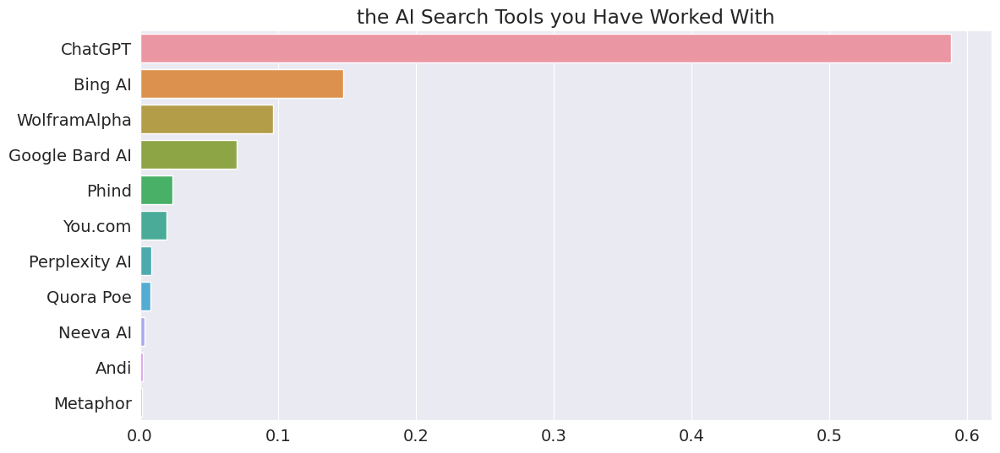

In [50]:
AISearchHaveWorkedWith_df = split_multicolumn(survey_df['AISearchHaveWorkedWith'])
AISearchHaveWorkedWith_per = AISearchHaveWorkedWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the AI Search Tools you Have Worked With")
sns.barplot(x=AISearchHaveWorkedWith_per, y=AISearchHaveWorkedWith_per.index);

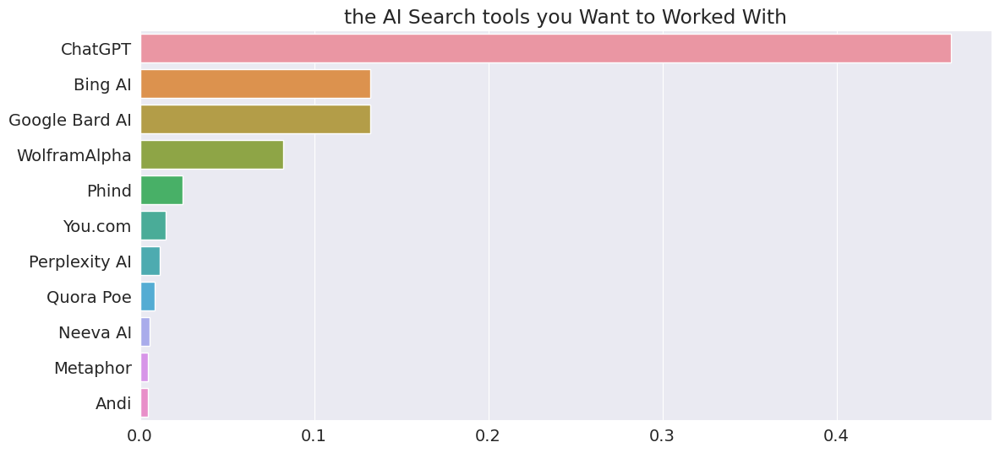

In [51]:
AISearchWantToWorkWith_df = split_multicolumn(survey_df['AISearchWantToWorkWith'])
AISearchWantToWorkWith_per = AISearchWantToWorkWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the AI Search tools you Want to Worked With")
sns.barplot(x=AISearchWantToWorkWith_per, y=AISearchWantToWorkWith_per.index);

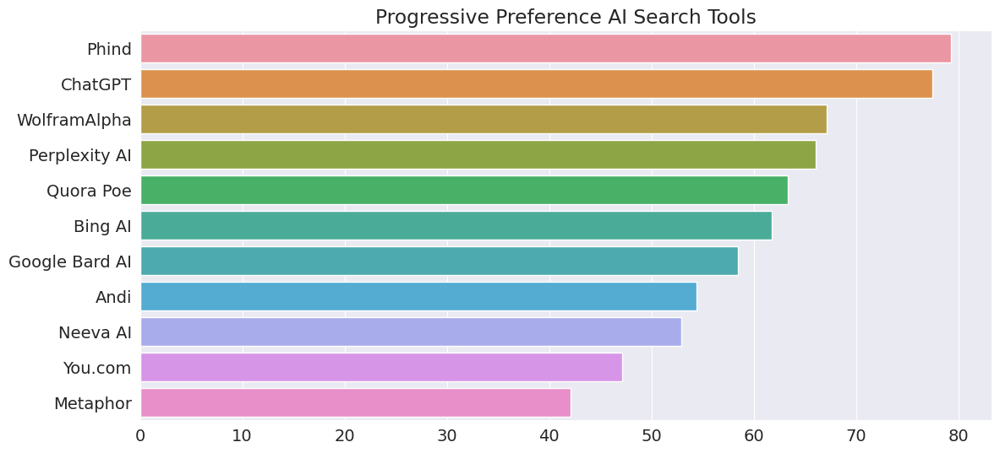

In [52]:
ProgressivePreferenceAISearch_df = AISearchHaveWorkedWith_df & AISearchWantToWorkWith_df
ProgressivePreferenceAISearch_per = (ProgressivePreferenceAISearch_df.sum() * 100 / AISearchHaveWorkedWith_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference AI Search Tools")
sns.barplot(x=ProgressivePreferenceAISearch_per, y=ProgressivePreferenceAISearch_per.index);

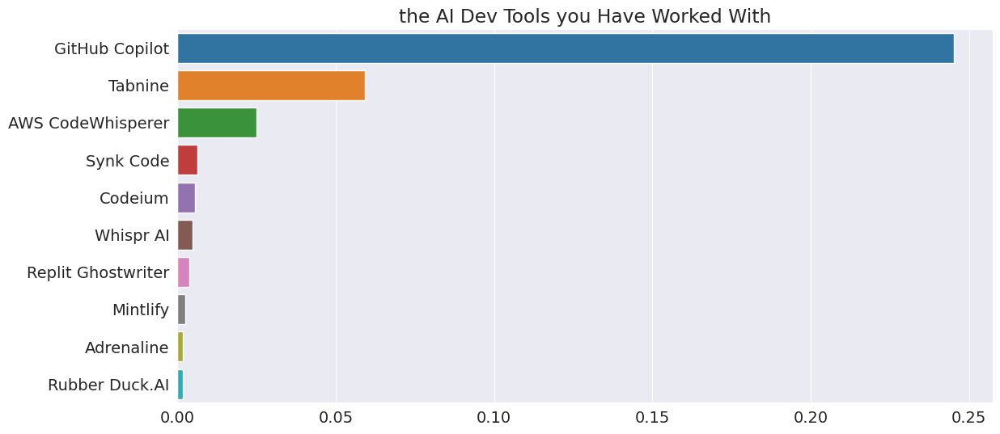

In [53]:
AIDevHaveWorkedWith_df = split_multicolumn(survey_df['AIDevHaveWorkedWith'])
AIDevHaveWorkedWith_per = AIDevHaveWorkedWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the AI Dev Tools you Have Worked With")
sns.barplot(x=AIDevHaveWorkedWith_per, y=AIDevHaveWorkedWith_per.index);

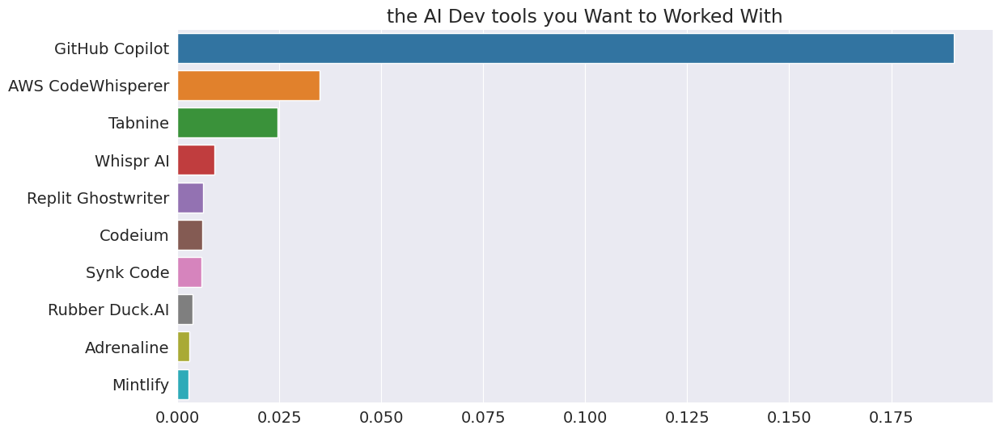

In [54]:
AIDevWantToWorkWith_df = split_multicolumn(survey_df['AIDevWantToWorkWith'])
AIDevWantToWorkWith_per = AIDevWantToWorkWith_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the AI Dev tools you Want to Worked With")
sns.barplot(x=AIDevWantToWorkWith_per, y=AIDevWantToWorkWith_per.index);

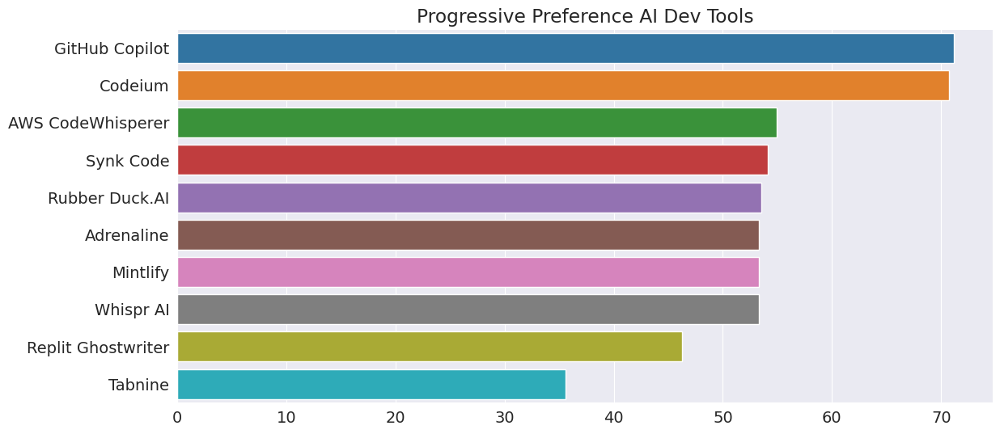

In [55]:
ProgressivePreferenceAIDev_df = AIDevHaveWorkedWith_df & AIDevWantToWorkWith_df
ProgressivePreferenceAIDev_per = (ProgressivePreferenceAIDev_df.sum() * 100 / AIDevHaveWorkedWith_df.sum()).sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("Progressive Preference AI Dev Tools")
sns.barplot(x=ProgressivePreferenceAIDev_per, y=ProgressivePreferenceAIDev_per.index);

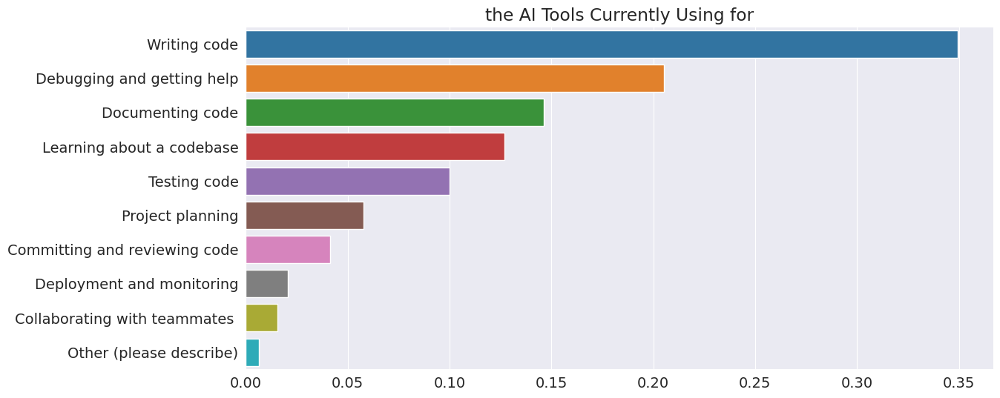

In [56]:
AIToolCurrently_Using_df = split_multicolumn(survey_df['AIToolCurrently Using'])
AIToolCurrently_Using_per = AIToolCurrently_Using_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the AI Tools Currently Using for")
sns.barplot(x=AIToolCurrently_Using_per, y=AIToolCurrently_Using_per.index);

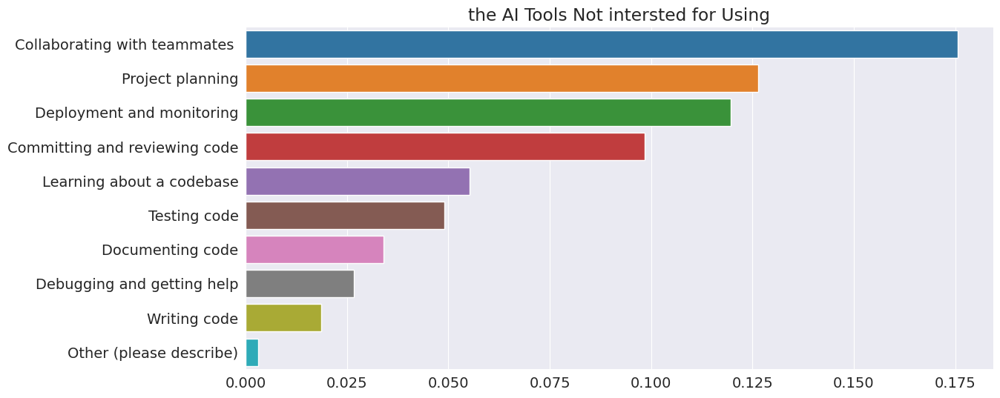

In [57]:
AIToolNot_interested_in_Using_df = split_multicolumn(survey_df['AIToolNot interested in Using'])
AIToolNot_interested_in_Using_per = AIToolNot_interested_in_Using_df.mean().sort_values(ascending=False).head(15)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the AI Tools Not intersted for Using")
sns.barplot(x=AIToolNot_interested_in_Using_per, y=AIToolNot_interested_in_Using_per.index);

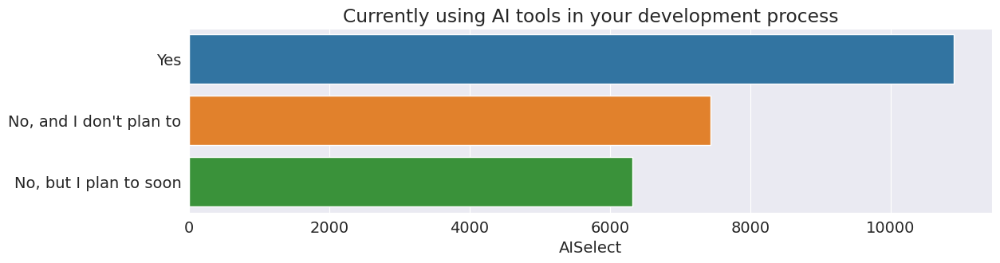

In [58]:
AISelect = survey_df['AISelect'].value_counts()
plt.figure(figsize=(13, 3))
plt.xticks(rotation=0)
plt.title("Currently using AI tools in your development process")
sns.barplot(x=AISelect, y=AISelect.index);

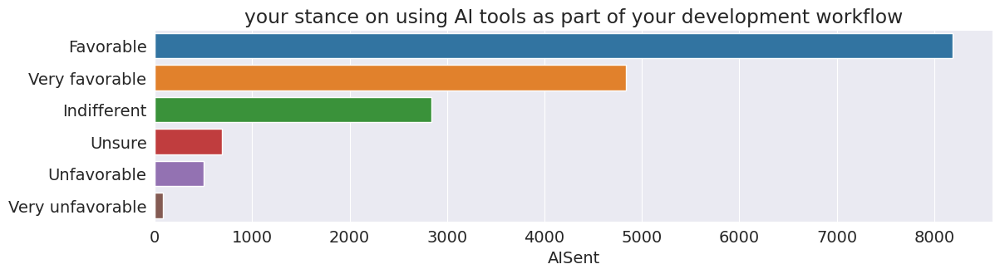

In [59]:
AISent = survey_df['AISent'].value_counts()
plt.figure(figsize=(13, 3))
plt.xticks(rotation=0)
plt.title("your stance on using AI tools as part of your development workflow")
sns.barplot(x=AISent, y=AISent.index);

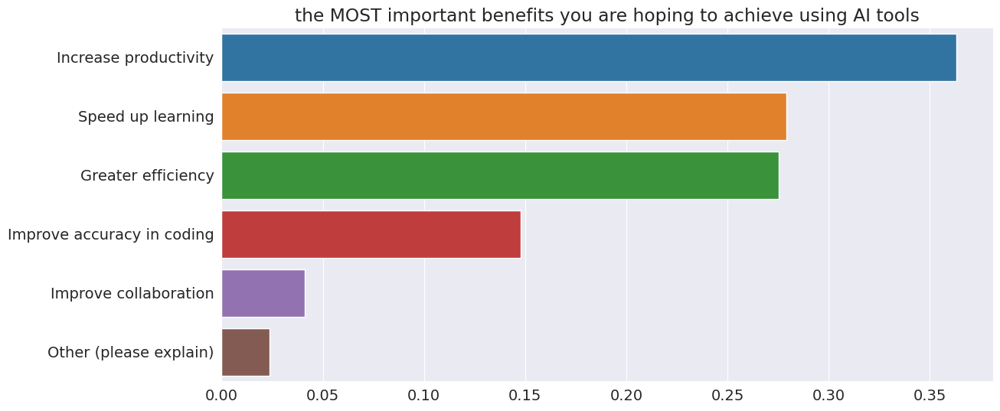

In [60]:
AIAcc = split_multicolumn(survey_df['AIAcc'])
AIAcc = AIAcc.mean().sort_values(ascending=False)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the MOST important benefits you are hoping to achieve using AI tools")
sns.barplot(x=AIAcc, y=AIAcc.index);

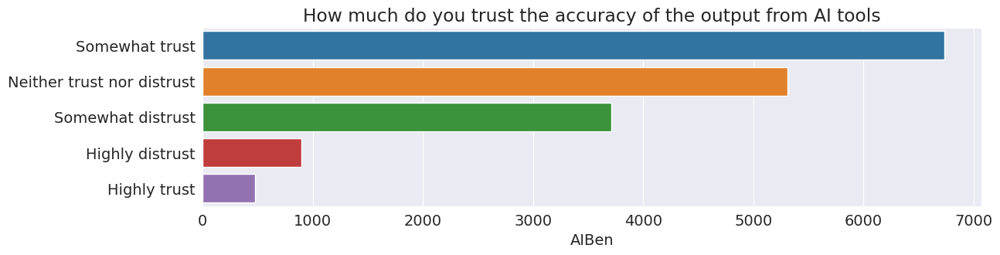

In [61]:
AIBen = survey_df['AIBen'].value_counts()
plt.figure(figsize=(13, 3))
plt.xticks(rotation=0)
plt.title("How much do you trust the accuracy of the output from AI tools")
sns.barplot(x=AIBen, y=AIBen.index);

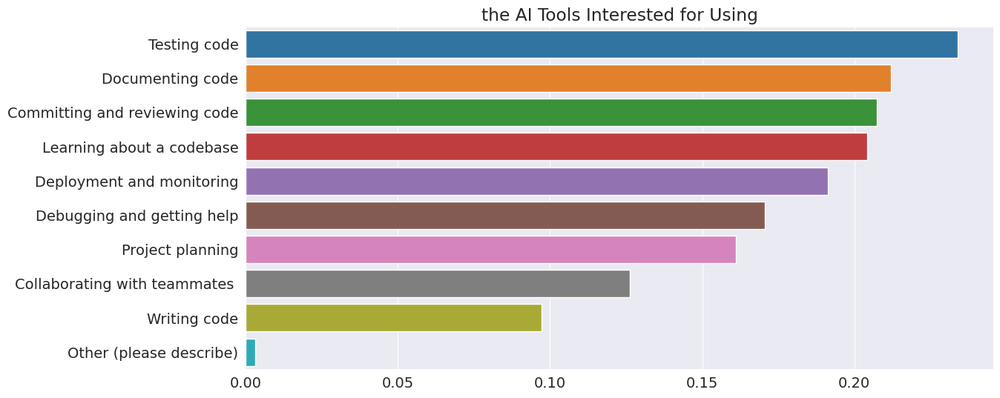

In [62]:
AIToolInterested_in_Using = split_multicolumn(survey_df['AIToolInterested in Using'])
AIToolInterested_in_Using = AIToolInterested_in_Using.mean().sort_values(ascending=False)
plt.figure(figsize=(13, 6))
plt.xticks(rotation=0)
plt.title("the AI Tools Interested for Using")
sns.barplot(x=AIToolInterested_in_Using, y=AIToolInterested_in_Using.index);

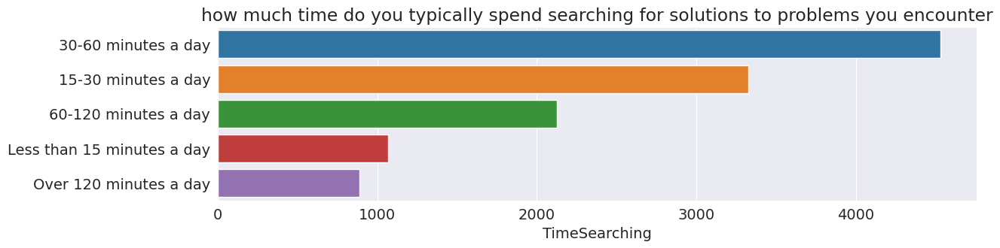

In [63]:
TimeSearching = survey_df['TimeSearching'].value_counts()
plt.figure(figsize=(13, 3))
plt.xticks(rotation=0)
plt.title("how much time do you typically spend searching for solutions to problems you encounter")
sns.barplot(x=TimeSearching, y=TimeSearching.index);

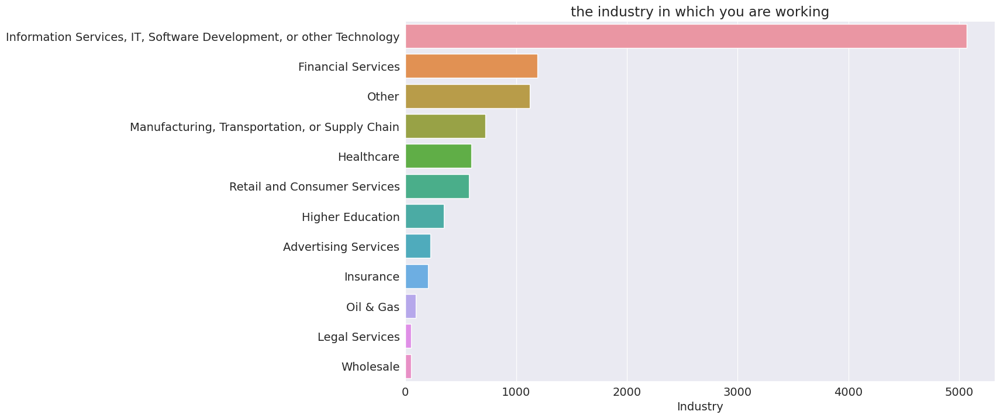

In [64]:
Industry = survey_df['Industry'].value_counts()
plt.figure(figsize=(13, 8))
plt.xticks(rotation=0)
plt.title("the industry in which you are working")
sns.barplot(x=Industry, y=Industry.index);

# Multiple Columns analysis

In [65]:
survey_df['Numbers'] = 1

In [66]:
def filter_age(row):
  if row=='25-34 years old':
    return '25-34 years'
  elif row=='35-44 years old':
    return '35-44 years'
  elif row=='45-54 years old':
    return '45-54 years'
  elif row=='18-24 years old':
    return '18-24 years'
  elif row=='Under 18 years old':
    return 'Under 18 yer'
  elif row=='55-64 years old':
    return '55-64 years'
  elif row=='65 years or older':
    return '65 years plus'
  elif row=='Prefer not to say':
    return 'not to say'

In [67]:
survey_df['Age'] = survey_df['Age'].apply(filter_age)

In [68]:
schema_df[schema_df['qname'] == 'TimeSearching']['question'].values

array(['On an average day, how much time do you typically spend searching for answers or solutions to problems you encounter at work? (This includes time spent searching on your own, asking a colleague, and waiting for a response).'],
      dtype=object)

In [69]:
numerical_columns = survey_df.select_dtypes(exclude=['object'])
categorical_columns = survey_df.select_dtypes(include=['object'])

In [70]:
numerical_columns.head(2)

,YearsCode,YearsCodePro,CompTotal,WorkExp,Numbers
0,6,60,NaN,60.0,1
1,14,12,75000.0,60.0,1


In [71]:
categorical_columns.head(2)

,Age,Employment,RemoteWork,EdLevel,LearnCodeCoursesCert,DevType,OrgSize,PurchaseInfluence,Country,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSysPersonal use,OpSysProfessional use,OfficeStackAsyncHaveWorkedWith,OfficeStackAsyncWantToWorkWith,OfficeStackSyncHaveWorkedWith,OfficeStackSyncWantToWorkWith,AISearchHaveWorkedWith,AISearchWantToWorkWith,AIDevHaveWorkedWith,AIDevWantToWorkWith,NEWSOSites,SOAccount,AIToolCurrently Using,AIToolNot interested in Using,AISelect,AISent,AIAcc,AIBen,AIToolInterested in Using,TimeSearching,Industry
0,18-24 years,"Employed, full-time;Student, part-time","Hybrid (some remote, some in-person)","Bachelor’s degree (B.A., B.S., B.Eng., etc.)",NaN,"Developer, embedded applications or devices",NaN,NaN,United States of America,Bash/Shell (all shells);C;C++;MATLAB;Python,Assembly;Bash/Shell (all shells);C;C++;Lua;Pow...,MariaDB;MySQL;SQLite,PostgreSQL,"Linode, now Akamai","Linode, now Akamai",NaN,NaN,Docker;GNU GCC;Make;QMake,Ansible;Docker;GNU GCC;Make,Atom;Notepad++;Qt Creator;Visual Studio Code,Android Studio;Notepad++;Qt Creator;Visual Stu...,Windows;Windows Subsystem for Linux (WSL),Windows;Windows Subsystem for Linux (WSL),Jira;Markdown File,Jira;Markdown File,Microsoft Teams,Microsoft Teams,NaN,NaN,NaN,NaN,Stack Overflow;Stack Exchange;Collectives on S...,Yes,NaN,NaN,"No, and I don't plan to",NaN,NaN,NaN,NaN,NaN,NaN
1,25-34 years,"Employed, full-time","Hybrid (some remote, some in-person)","Secondary school (e.g. American high school, G...",NaN,"Developer, full-stack",20 to 99 employees,I have a great deal of influence,United Kingdom of Great Britain and Northern I...,Bash/Shell (all shells);HTML/CSS;Java;JavaScri...,Bash/Shell (all shells);HTML/CSS;Rust;SQL;Type...,MariaDB;MySQL;PostgreSQL;SQLite,MariaDB;PostgreSQL;SQLite,Amazon Web Services (AWS);Cloudflare;Google Cl...,Hetzner,Laravel;NestJS;Next.js;Node.js;React,Deno;NestJS;Next.js;Node.js;React,Cargo;CMake;Docker;Make;npm;Pip;Yarn,Cargo;Docker;npm;Yarn,Nano;Neovim;Visual Studio Code,Neovim;Visual Studio Code,Other Linux-based,Other Linux-based,GitHub Discussions;Markdown File;Notion;Wikis,GitHub Discussions;Markdown File;Notion;Wikis,Google Meet;Microsoft Teams;Whatsapp;Zoom,NaN,Bing AI;ChatGPT;WolframAlpha,WolframAlpha,NaN,NaN,Stack Overflow;Stack Exchange,Not sure/can't remember,NaN,NaN,"No, and I don't plan to",NaN,NaN,NaN,NaN,NaN,NaN


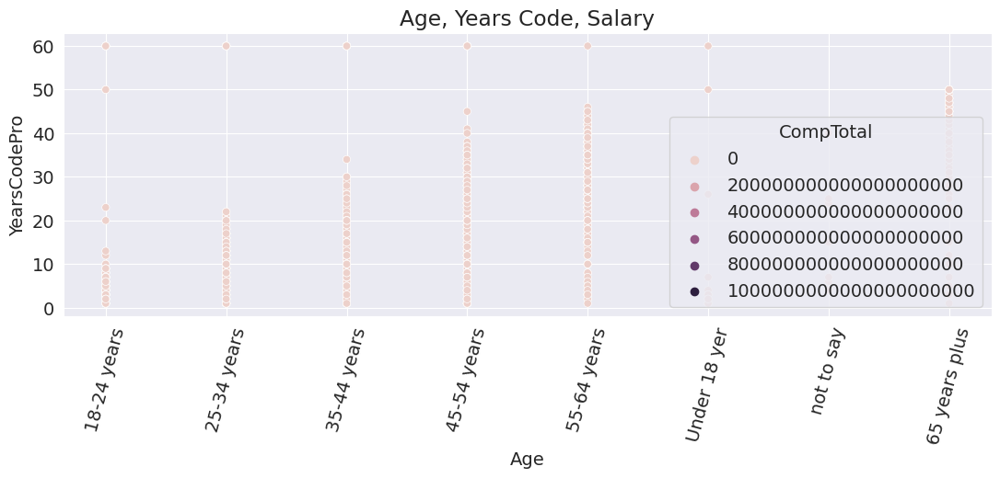

In [72]:
plt.figure(figsize=(13, 4))
plt.xticks(rotation=75)
plt.title("Age, Years Code, Salary")
sns.scatterplot(x=survey_df['Age'], y=survey_df['YearsCodePro'], hue=survey_df['CompTotal']);

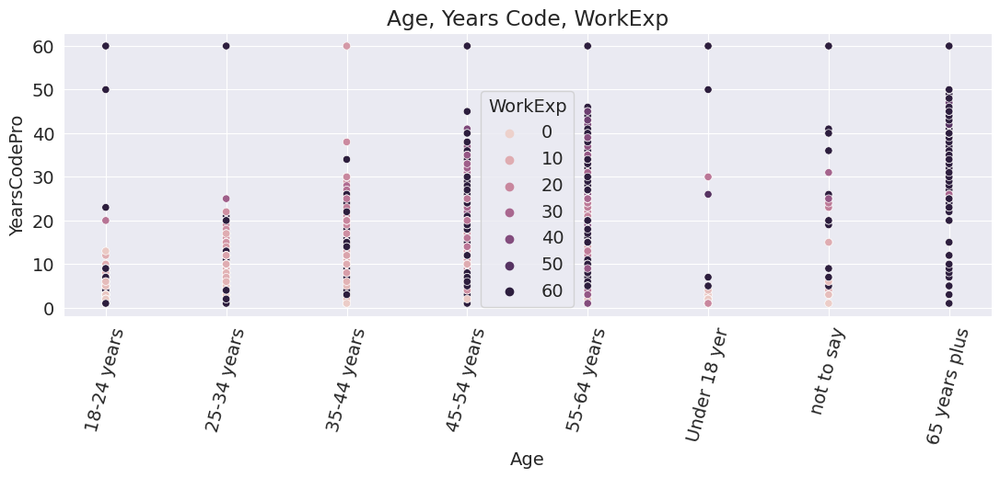

In [73]:
plt.figure(figsize=(13, 4))
plt.xticks(rotation=75)
plt.title("Age, Years Code, WorkExp")
sns.scatterplot(x=survey_df['Age'], y=survey_df['YearsCodePro'], hue=survey_df['WorkExp']);

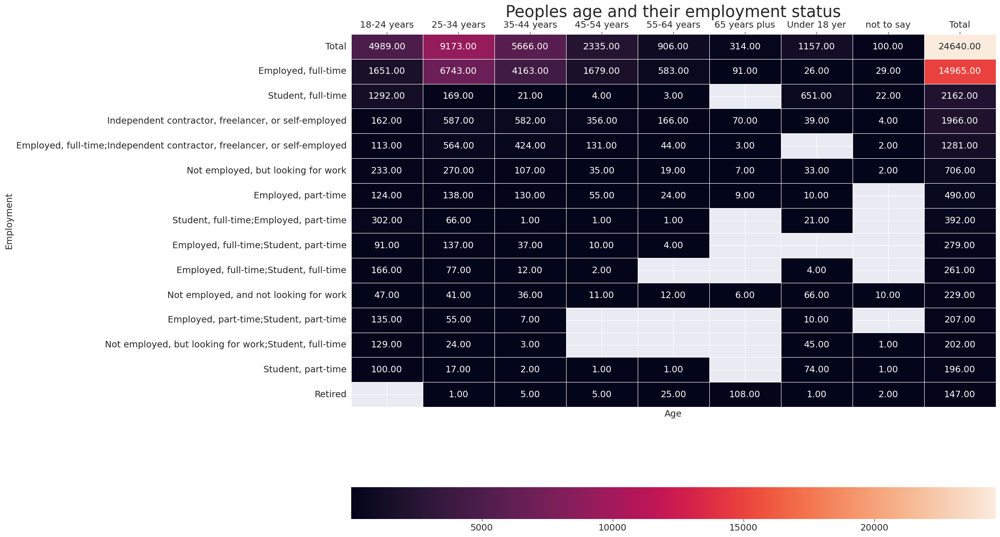

In [74]:
employ_age = survey_df.pivot_table(index='Employment', columns='Age', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
employ_age = employ_age.sort_values(by='Total', axis=0, ascending=False).head(15)

plt.figure(figsize=(18, 15))
sns.heatmap(employ_age, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("Peoples age and their employment status", fontdict={'fontsize':25})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)

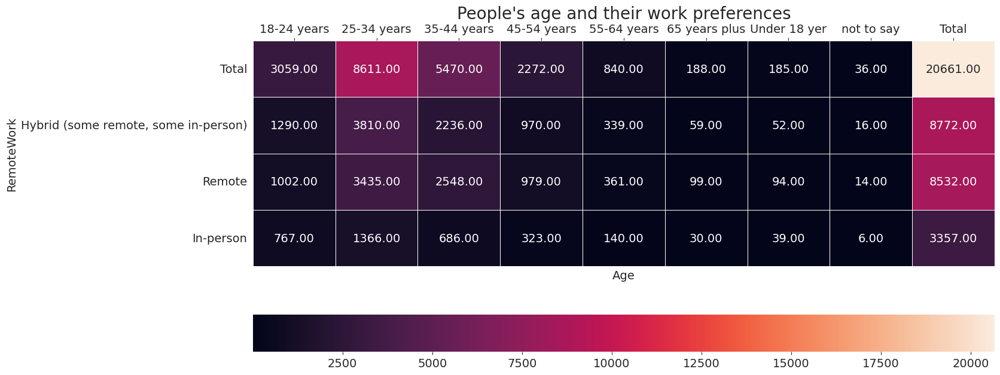

In [75]:
age_remote = survey_df.pivot_table(index='RemoteWork', columns='Age', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
age_remote = age_remote.sort_values(by='Total', axis=0, ascending=False)

plt.figure(figsize=(16, 7))
plt.title("People's age and their work preferences", fontdict={'fontsize':20})
sns.heatmap(age_remote, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)

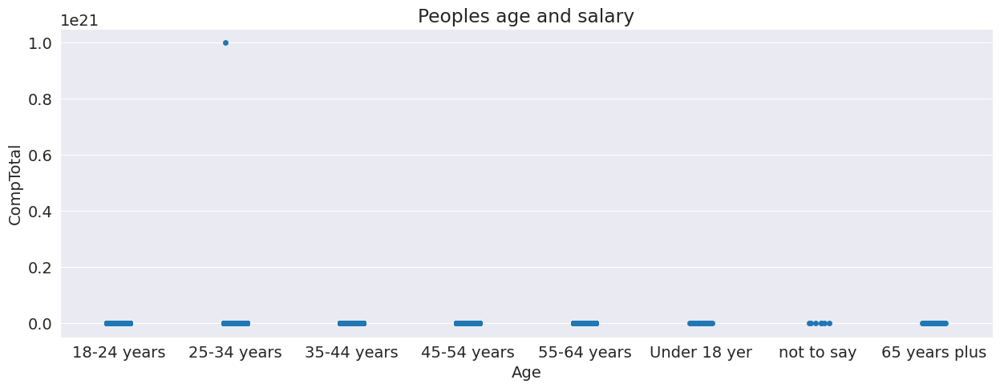

In [76]:
plt.figure(figsize=(15, 5))
plt.title("Peoples age and salary")
sns.stripplot(x=survey_df['Age'], y=survey_df['CompTotal']);

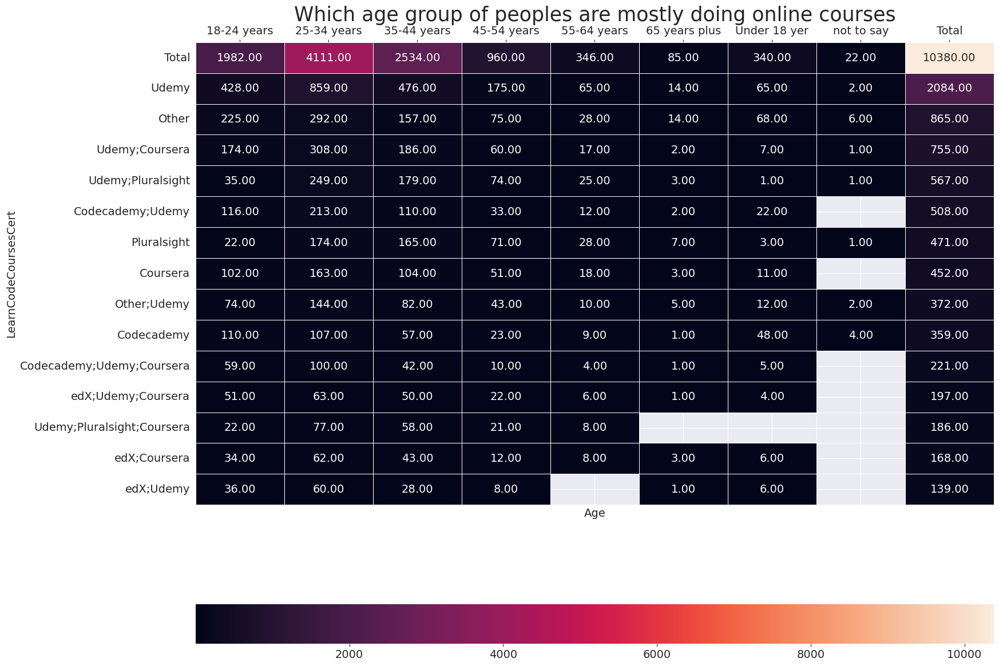

In [77]:
age_course = survey_df.pivot_table(index='LearnCodeCoursesCert', columns='Age', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
age_course = age_course.sort_values(by='Total', axis=0, ascending=False).head(15)

plt.figure(figsize=(18, 15))
sns.heatmap(age_course, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("Which age group of peoples are mostly doing online courses", fontdict={'fontsize':25})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)

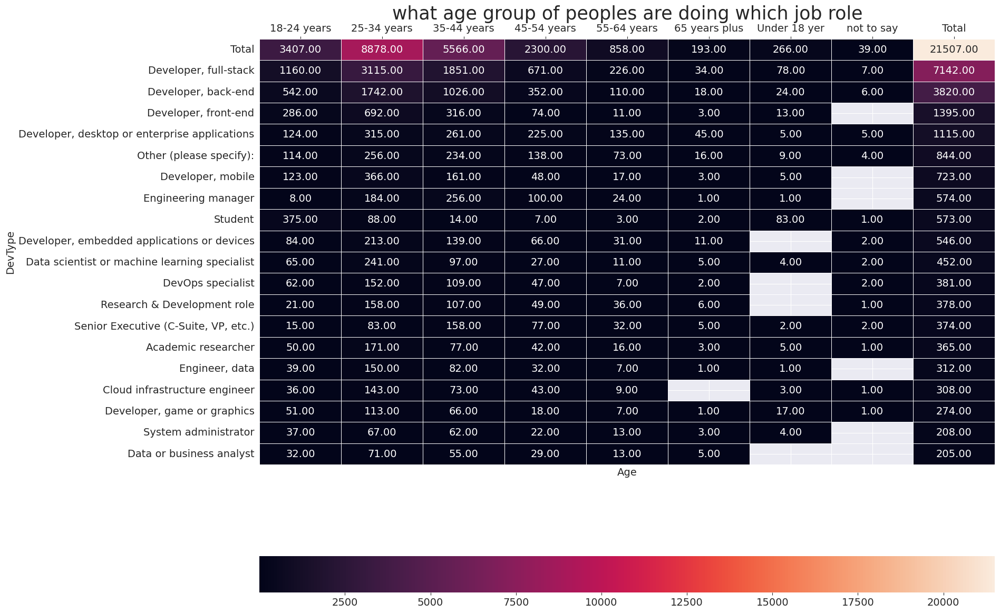

In [78]:
age_dev = survey_df.pivot_table(index='DevType', columns='Age', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
age_dev = age_dev.sort_values(by='Total', axis=0, ascending=False).head(20)

plt.figure(figsize=(18, 15))
sns.heatmap(age_dev, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("what age group of peoples are doing which job role", fontdict={'fontsize':25})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)

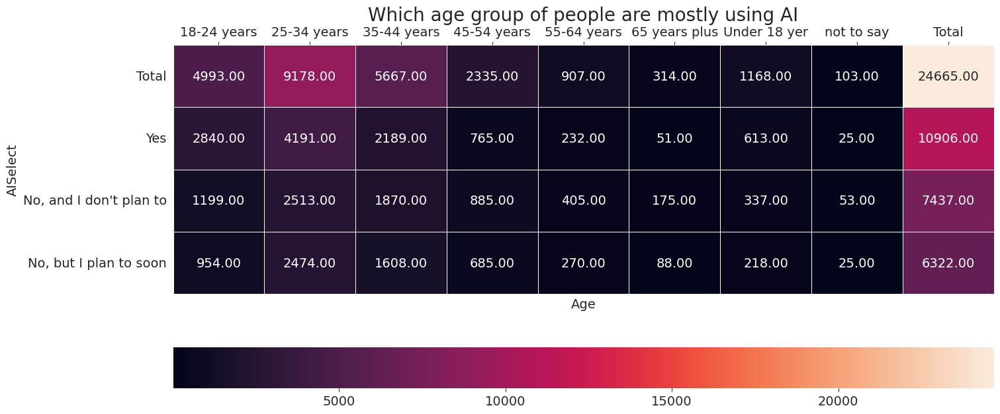

In [79]:
age_ai = survey_df.pivot_table(index='AISelect', columns='Age', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
age_ai = age_ai.sort_values(by='Total', axis=0, ascending=False)

plt.figure(figsize=(16, 7))
sns.heatmap(age_ai, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("Which age group of people are mostly using AI", fontdict={'fontsize':20})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)

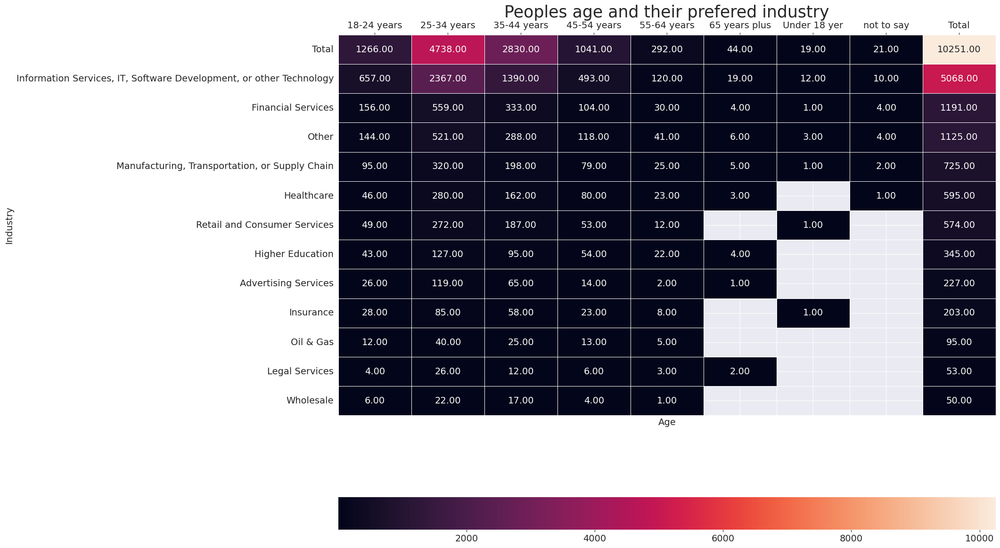

In [80]:
age_indus = survey_df.pivot_table(index='Industry', columns='Age', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
age_indus = age_indus.sort_values(by='Total', axis=0, ascending=False)

plt.figure(figsize=(18, 15))
sns.heatmap(age_indus, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("Peoples age and their prefered industry", fontdict={'fontsize':25})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)

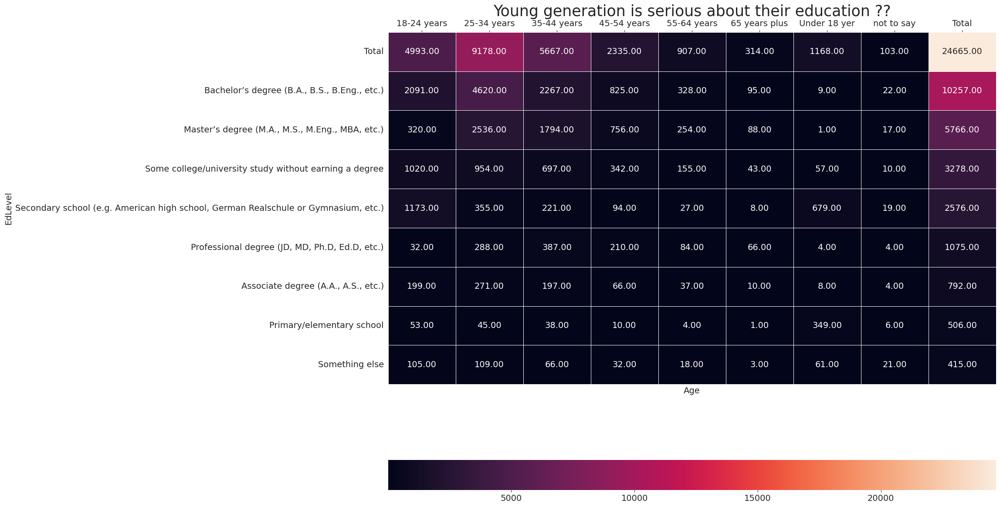

In [81]:
age_educ = survey_df.pivot_table(index='EdLevel', columns='Age', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
age_educ = age_educ.sort_values(by='Total', axis=0, ascending=False)

plt.figure(figsize=(18, 15))
sns.heatmap(age_educ, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("Young generation is serious about their education ??", fontdict={'fontsize':25})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)

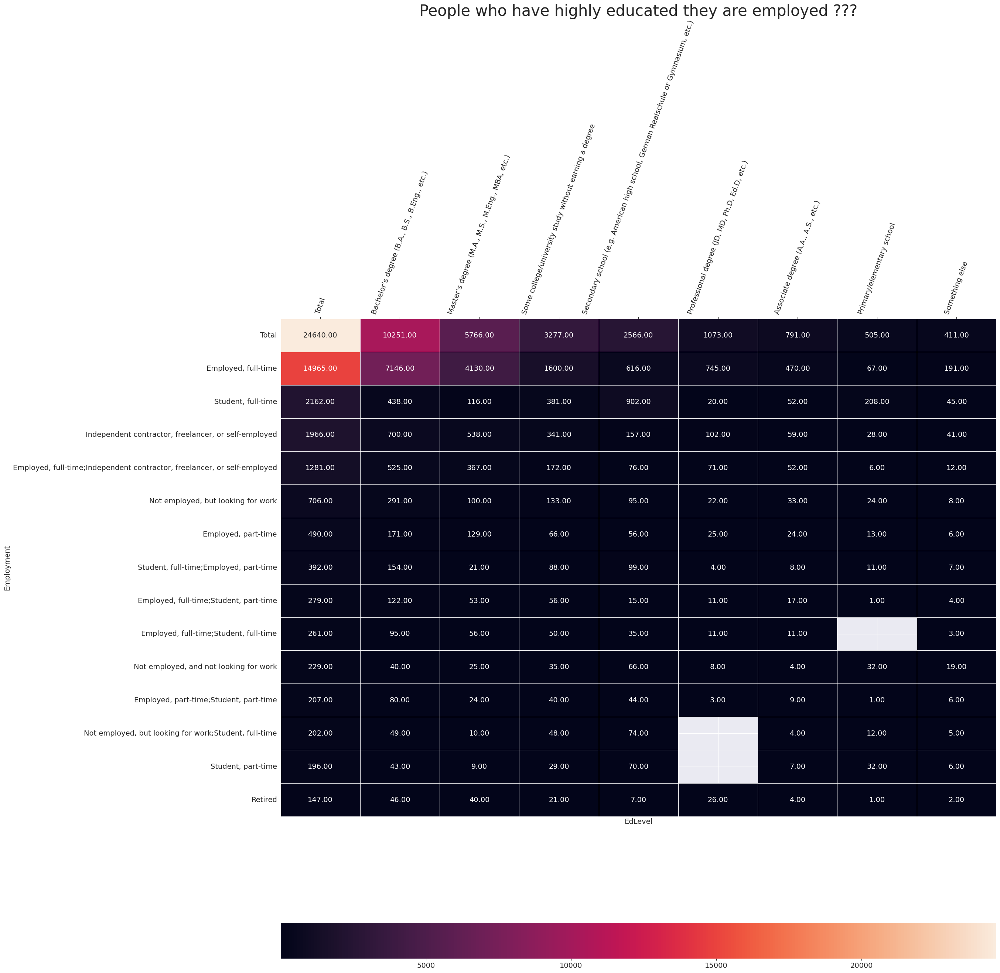

In [82]:
emp_ed = survey_df.pivot_table(index='Employment', columns='EdLevel', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
emp_ed = emp_ed.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
emp_ed = emp_ed.iloc[:15, :15]

plt.figure(figsize=(25, 25))
sns.heatmap(emp_ed, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("People who have highly educated they are employed ???", fontdict={'fontsize':30})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

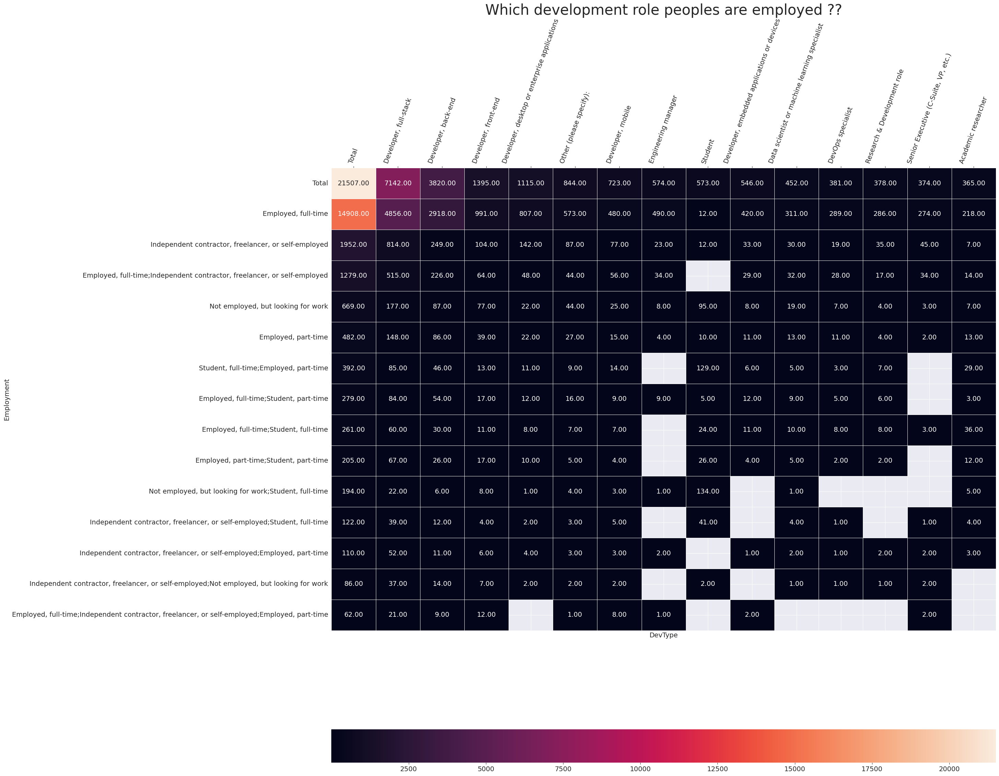

In [83]:
emp_dev = survey_df.pivot_table(index='Employment', columns='DevType', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
emp_dev = emp_dev.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
emp_dev = emp_dev.iloc[:15, :15]

plt.figure(figsize=(25, 25))
sns.heatmap(emp_dev, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("Which development role peoples are employed ??", fontdict={'fontsize':30})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

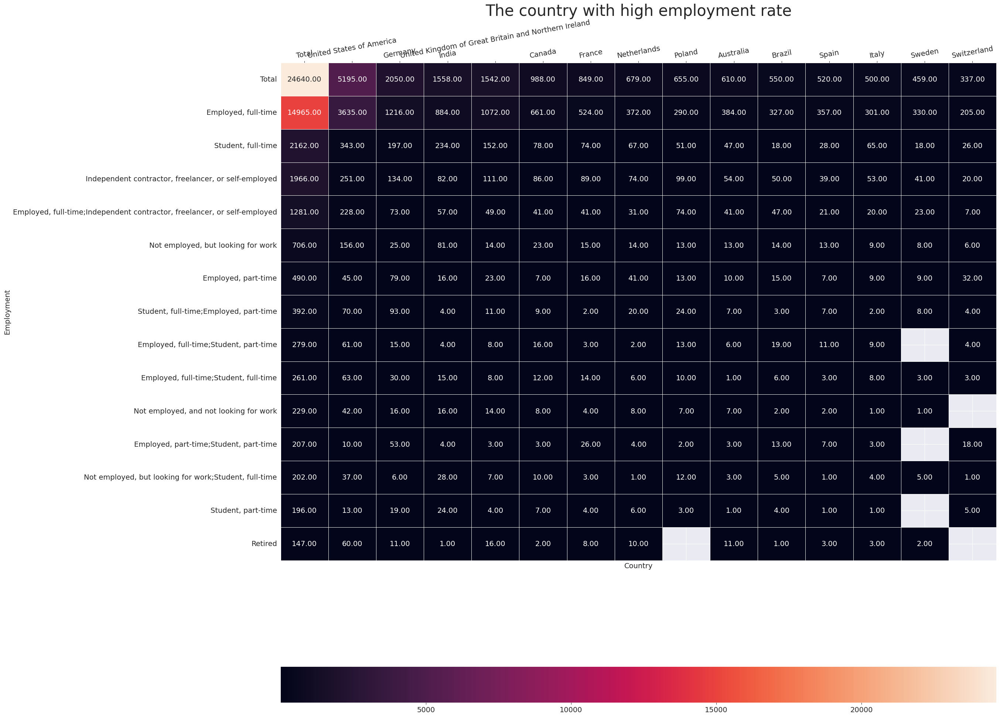

In [84]:
emp_con = survey_df.pivot_table(index='Employment', columns='Country', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
emp_con = emp_con.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
emp_con = emp_con.iloc[:15, :15]

plt.figure(figsize=(25, 25))
sns.heatmap(emp_con, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("The country with high employment rate", fontdict={'fontsize':30})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=10)
plt.show();

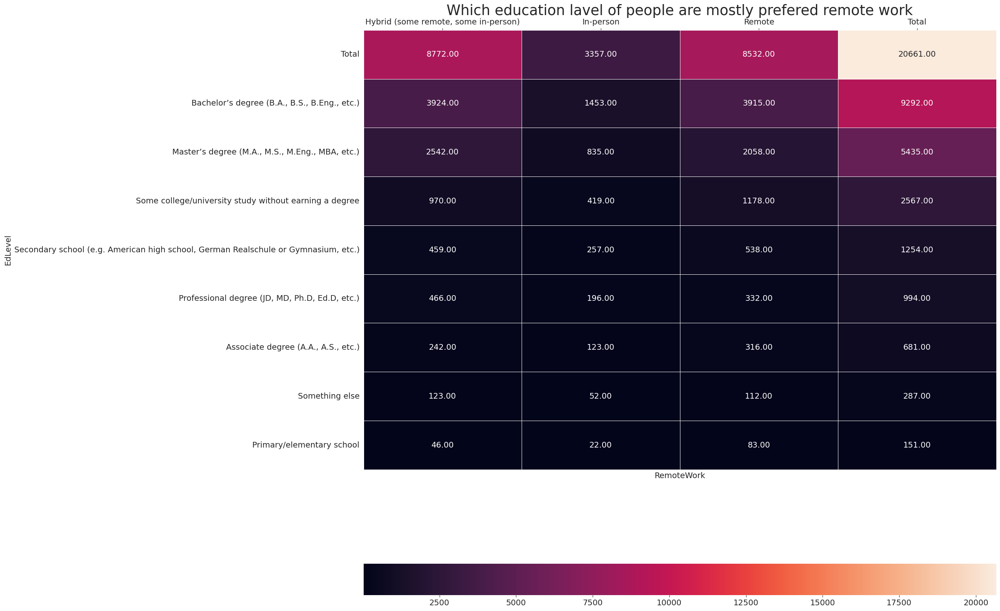

In [85]:
rem_ed = survey_df.pivot_table(index='EdLevel', columns='RemoteWork', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
rem_ed = rem_ed.sort_values(by='Total', axis=0, ascending=False)

plt.figure(figsize=(20, 20))
sns.heatmap(rem_ed, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("Which education lavel of people are mostly prefered remote work", fontdict={'fontsize':25})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=0)
plt.show();

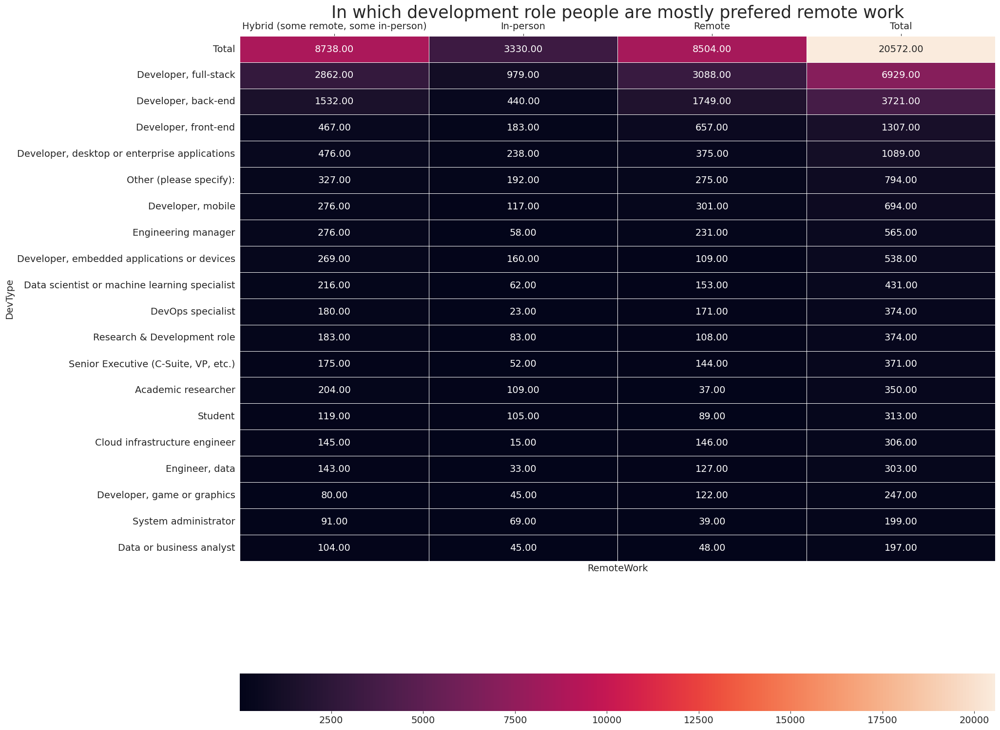

In [86]:
rem_dev = survey_df.pivot_table(index='DevType', columns='RemoteWork', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
rem_dev = rem_dev.sort_values(by='Total', axis=0, ascending=False)
rem_dev = rem_dev.head(20)

plt.figure(figsize=(20, 20))
sns.heatmap(rem_dev, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("In which development role people are mostly prefered remote work", fontdict={'fontsize':25})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=0)
plt.show();

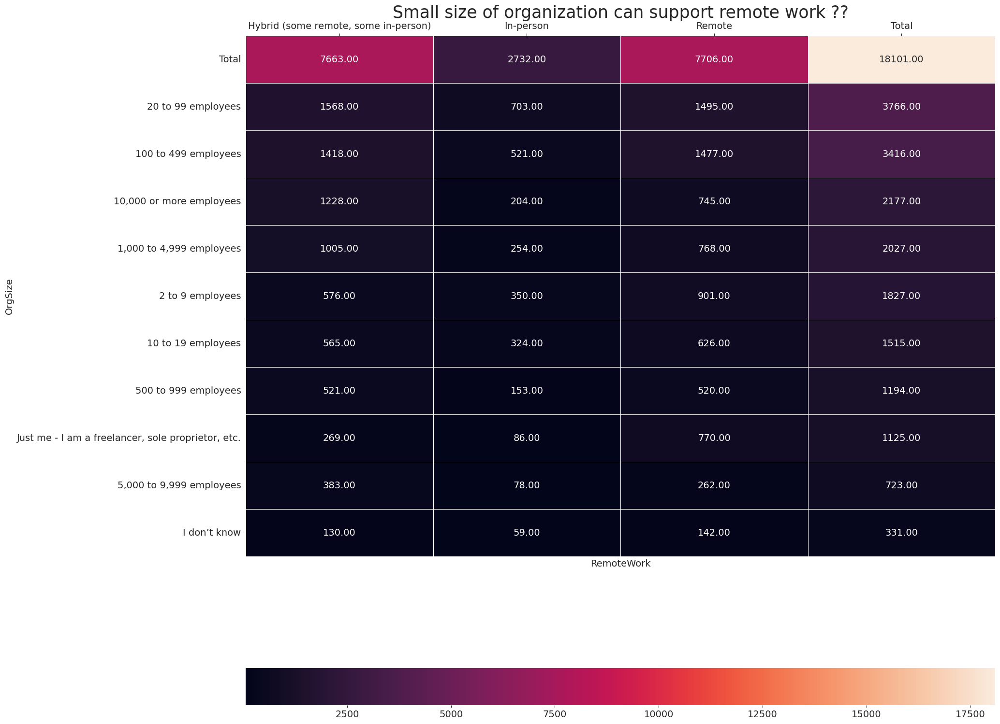

In [87]:
rem_orgsize = survey_df.pivot_table(index='OrgSize', columns='RemoteWork', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
rem_orgsize = rem_orgsize.sort_values(by='Total', axis=0, ascending=False)

plt.figure(figsize=(20, 20))
sns.heatmap(rem_orgsize, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("Small size of organization can support remote work ??", fontdict={'fontsize':25})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=0)
plt.show();

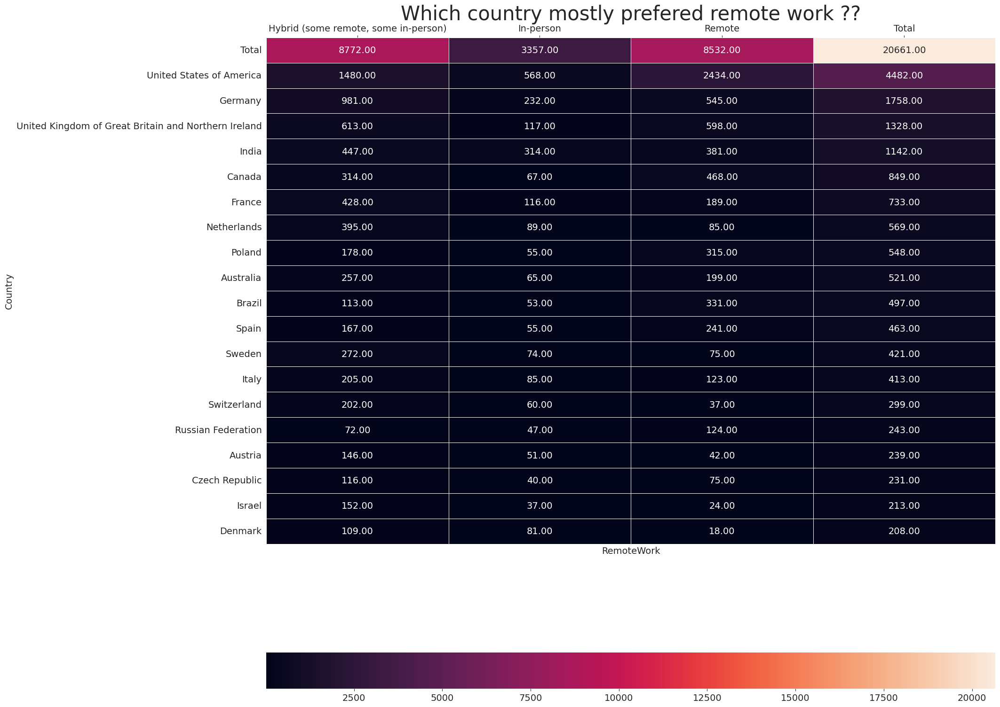

In [88]:
rem_cont = survey_df.pivot_table(index='Country', columns='RemoteWork', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
rem_cont = rem_cont.sort_values(by='Total', axis=0, ascending=False)
rem_cont = rem_cont.head(20)

plt.figure(figsize=(20, 20))
sns.heatmap(rem_cont, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.title("Which country mostly prefered remote work ??", fontdict={'fontsize':30})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=0)
plt.show();

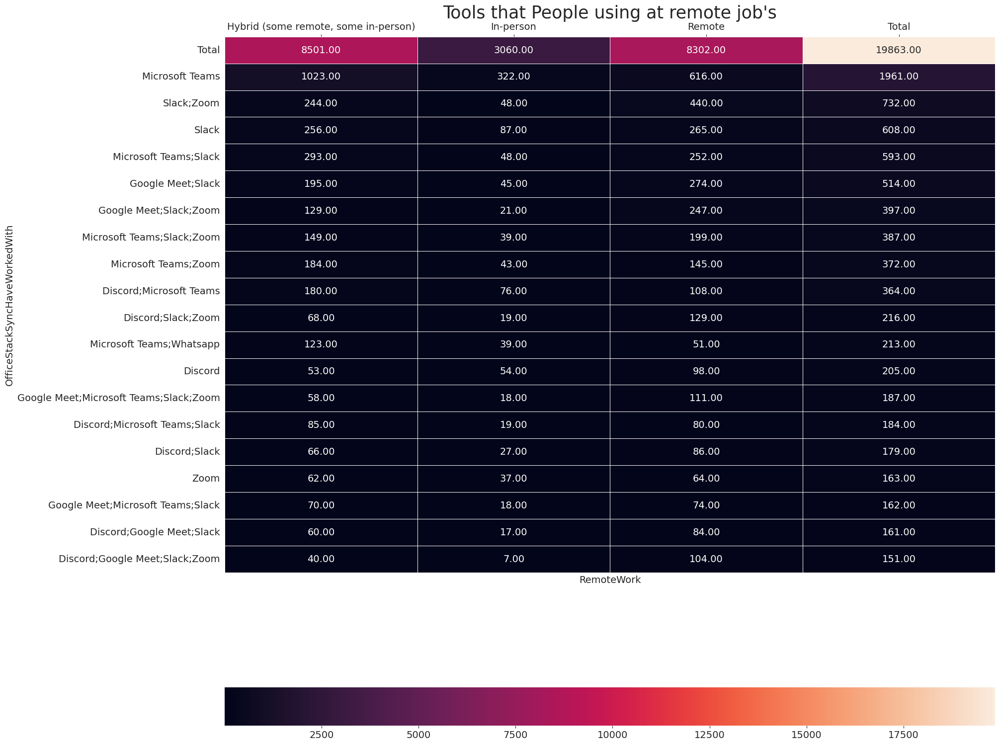

In [89]:
rem_tools = survey_df.pivot_table(index='OfficeStackSyncHaveWorkedWith', columns='RemoteWork', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
rem_tools = rem_tools.sort_values(by='Total', axis=0, ascending=False)
rem_tools = rem_tools.head(20)

plt.figure(figsize=(20, 20))
plt.title("Tools that People using at remote job's", fontdict={'fontsize':25})
sns.heatmap(rem_tools, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=0)
plt.show();

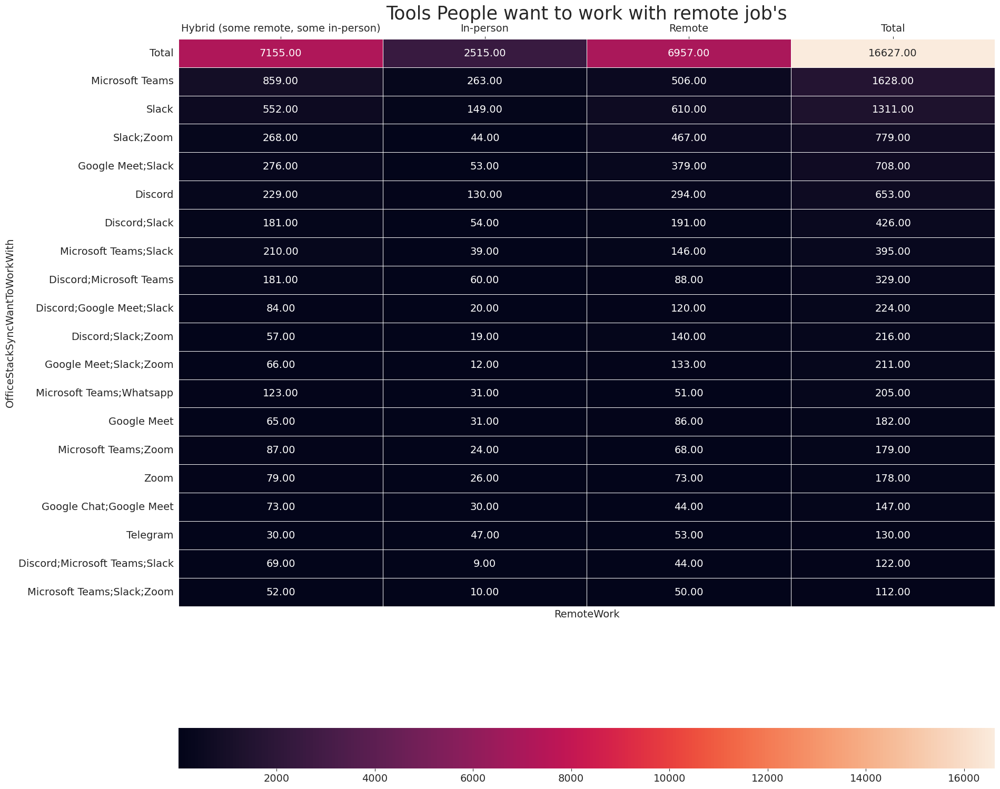

In [90]:
rem_tools = survey_df.pivot_table(index='OfficeStackSyncWantToWorkWith', columns='RemoteWork', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
rem_tools = rem_tools.sort_values(by='Total', axis=0, ascending=False)
rem_tools = rem_tools.head(20)

plt.figure(figsize=(20, 20))
plt.title("Tools People want to work with remote job's", fontdict={'fontsize':25})
sns.heatmap(rem_tools, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=0)
plt.show();

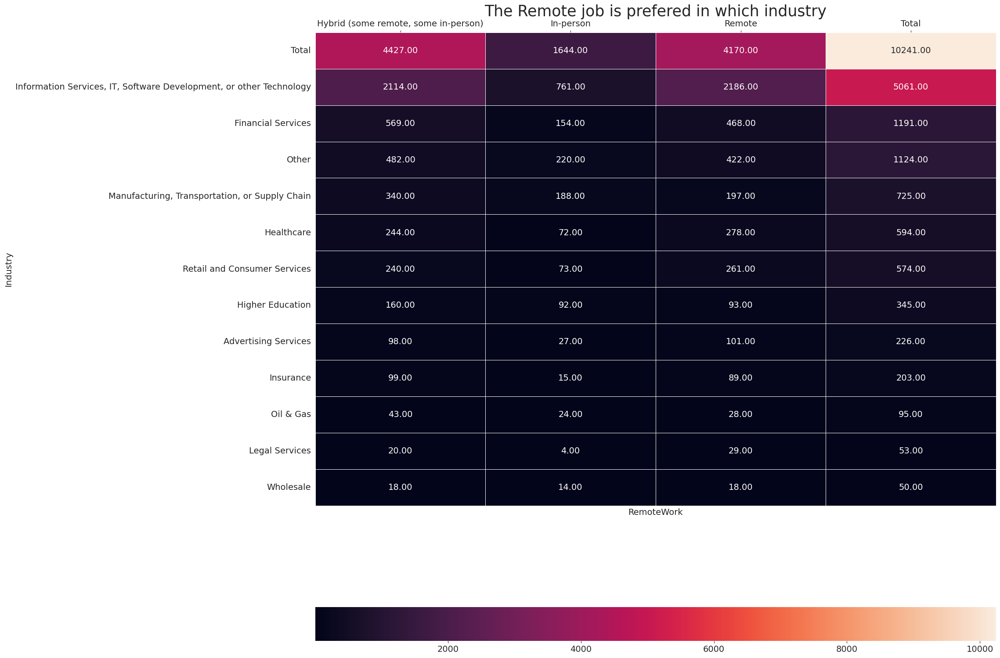

In [91]:
rem_ind = survey_df.pivot_table(index='Industry', columns='RemoteWork', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
rem_ind = rem_ind.sort_values(by='Total', axis=0, ascending=False)

plt.figure(figsize=(20, 20))
plt.title("The Remote job is prefered in which industry", fontdict={'fontsize':25})
sns.heatmap(rem_ind, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=0)
plt.show();

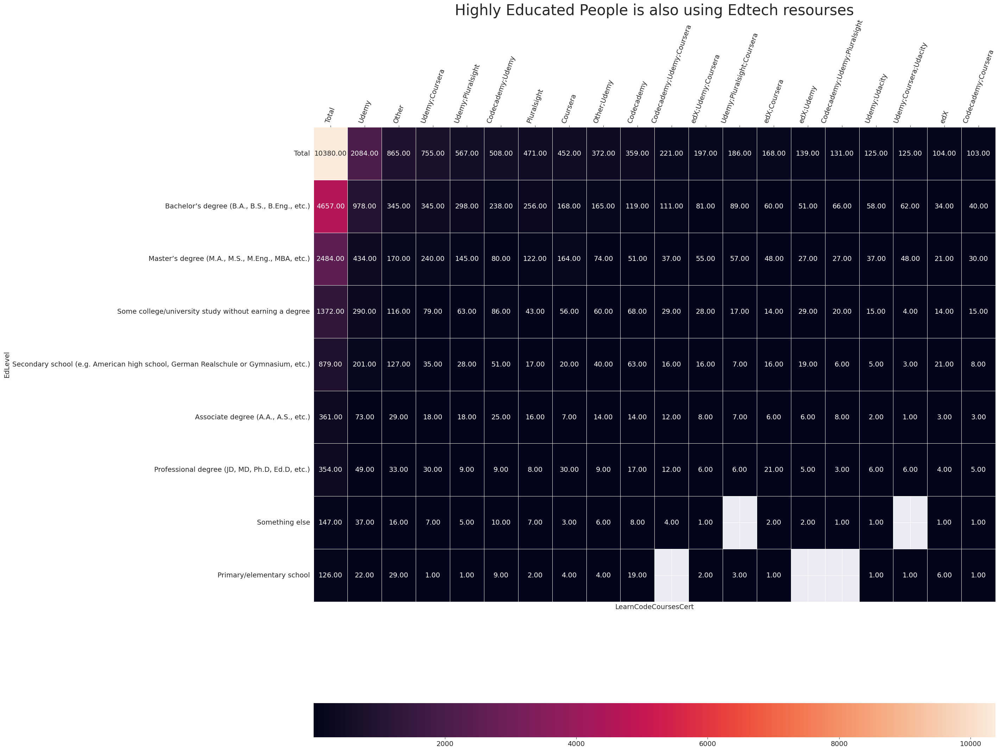

In [92]:
ed_cour = survey_df.pivot_table(index='EdLevel', columns='LearnCodeCoursesCert', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
ed_cour = ed_cour.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
ed_cour = ed_cour.iloc[:, :20]

plt.figure(figsize=(25, 25))
plt.title("Highly Educated People is also using Edtech resourses", fontdict={'fontsize':30})
sns.heatmap(ed_cour, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

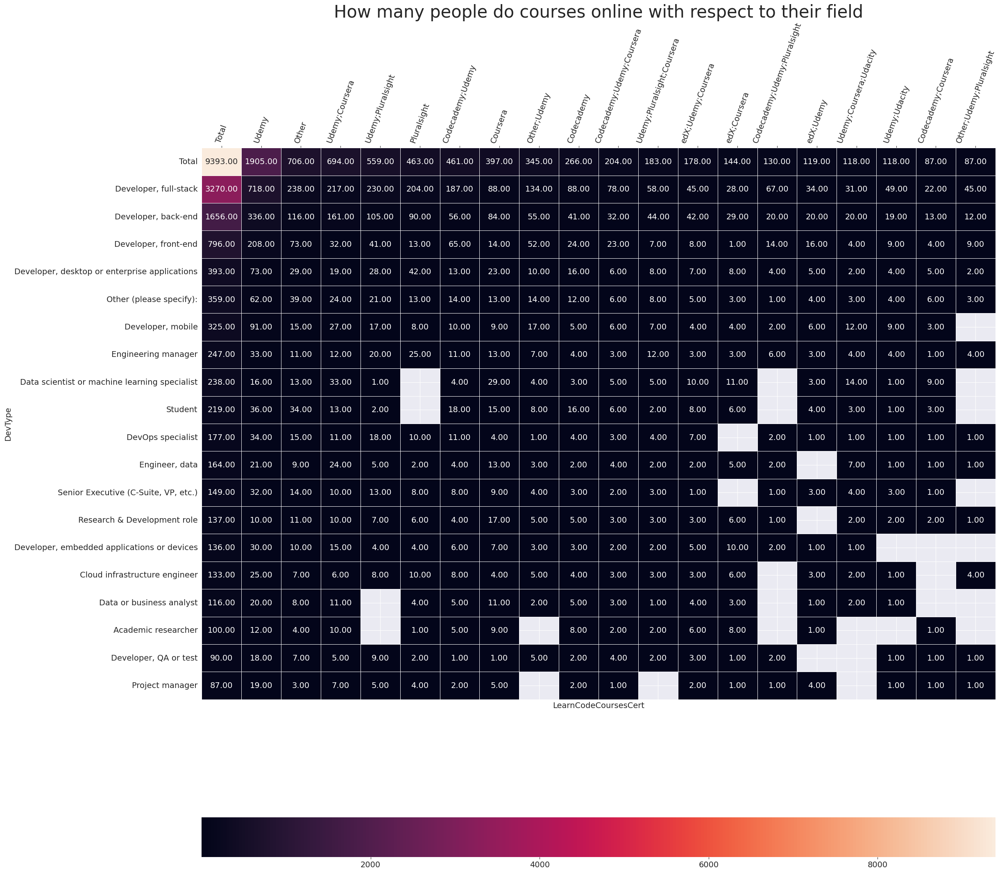

In [93]:
cour_dev = survey_df.pivot_table(index='DevType', columns='LearnCodeCoursesCert', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
cour_dev = cour_dev.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
cour_dev = cour_dev.iloc[:20, :20]

plt.figure(figsize=(25, 25))
plt.title("How many people do courses online with respect to their field", fontdict={'fontsize':30})
sns.heatmap(cour_dev, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

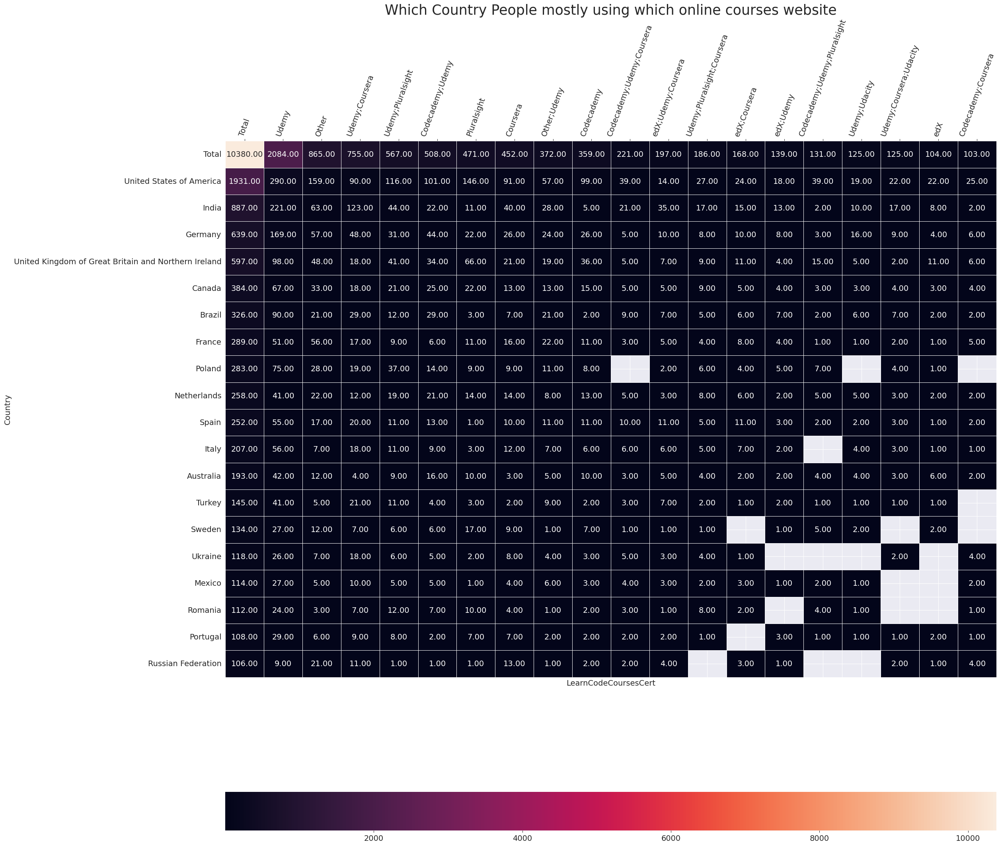

In [94]:
cour_con = survey_df.pivot_table(index='Country', columns='LearnCodeCoursesCert', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
cour_con = cour_con.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
cour_con = cour_con.iloc[:20, :20]

plt.figure(figsize=(25, 25))
plt.title("Which Country People mostly using which online courses website", fontdict={'fontsize':25})
sns.heatmap(cour_con, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

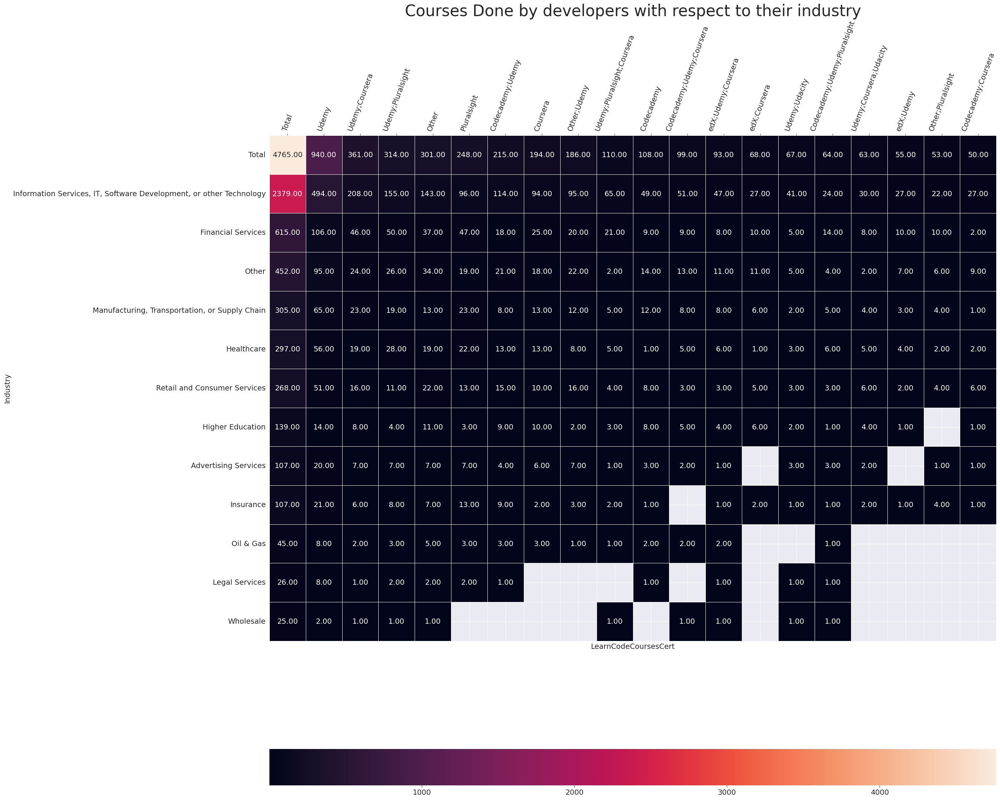

In [95]:
cour_ind = survey_df.pivot_table(index='Industry', columns='LearnCodeCoursesCert', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
cour_ind = cour_ind.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
cour_ind = cour_ind.iloc[:20, :20]

plt.figure(figsize=(25, 25))
plt.title("Courses Done by developers with respect to their industry", fontdict={'fontsize':30})
sns.heatmap(cour_ind, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

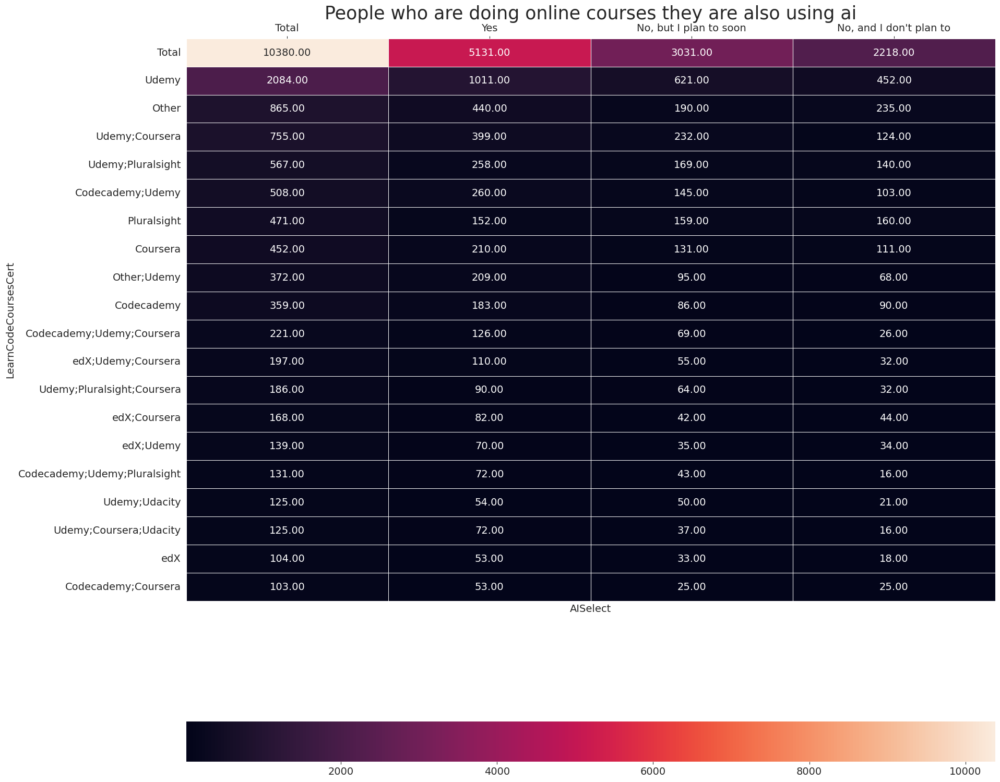

In [96]:
cour_ai = survey_df.pivot_table(index='LearnCodeCoursesCert', columns='AISelect', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
cour_ai = cour_ai.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
cour_ai = cour_ai.iloc[:20, :]

plt.figure(figsize=(20, 20))
plt.title("People who are doing online courses they are also using ai", fontdict={'fontsize':25})
sns.heatmap(cour_ai, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=0)
plt.show();

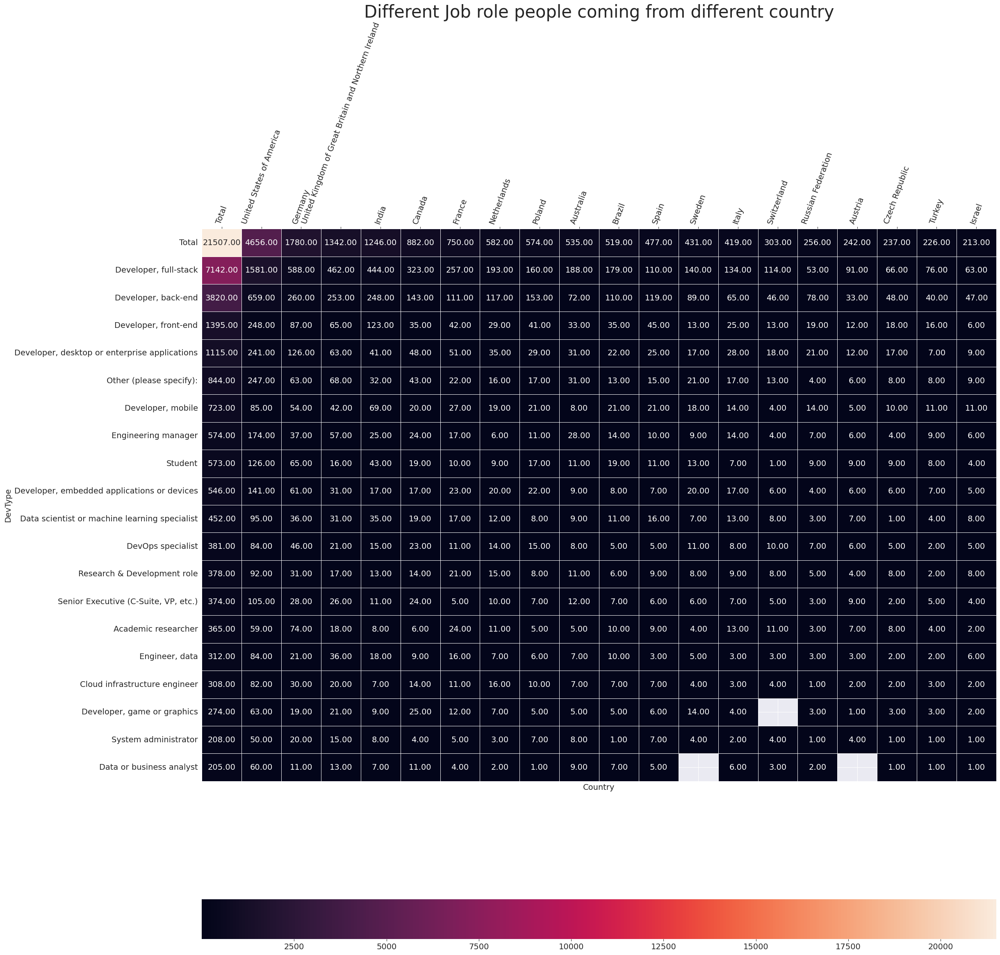

In [97]:
dev_con = survey_df.pivot_table(index='DevType', columns='Country', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
dev_con = dev_con.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
dev_con = dev_con.iloc[:20, :20]

plt.figure(figsize=(25, 25))
plt.title("Different Job role people coming from different country", fontdict={'fontsize':30})
sns.heatmap(dev_con, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

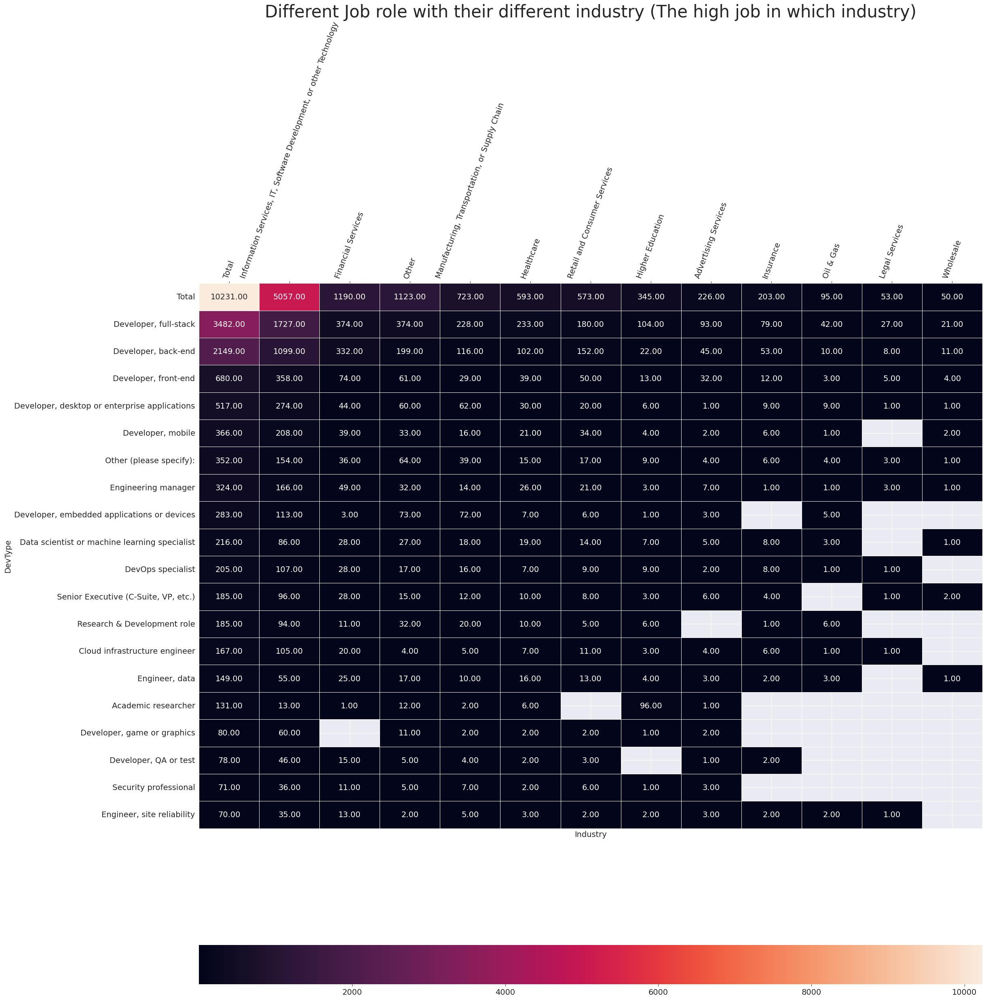

In [98]:
dev_ind = survey_df.pivot_table(index='DevType', columns='Industry', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
dev_ind = dev_ind.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
dev_ind = dev_ind.iloc[:20, :20]

plt.figure(figsize=(25, 25))
plt.title("Different Job role with their different industry (The high job in which industry)", fontdict={'fontsize':30})
sns.heatmap(dev_ind, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

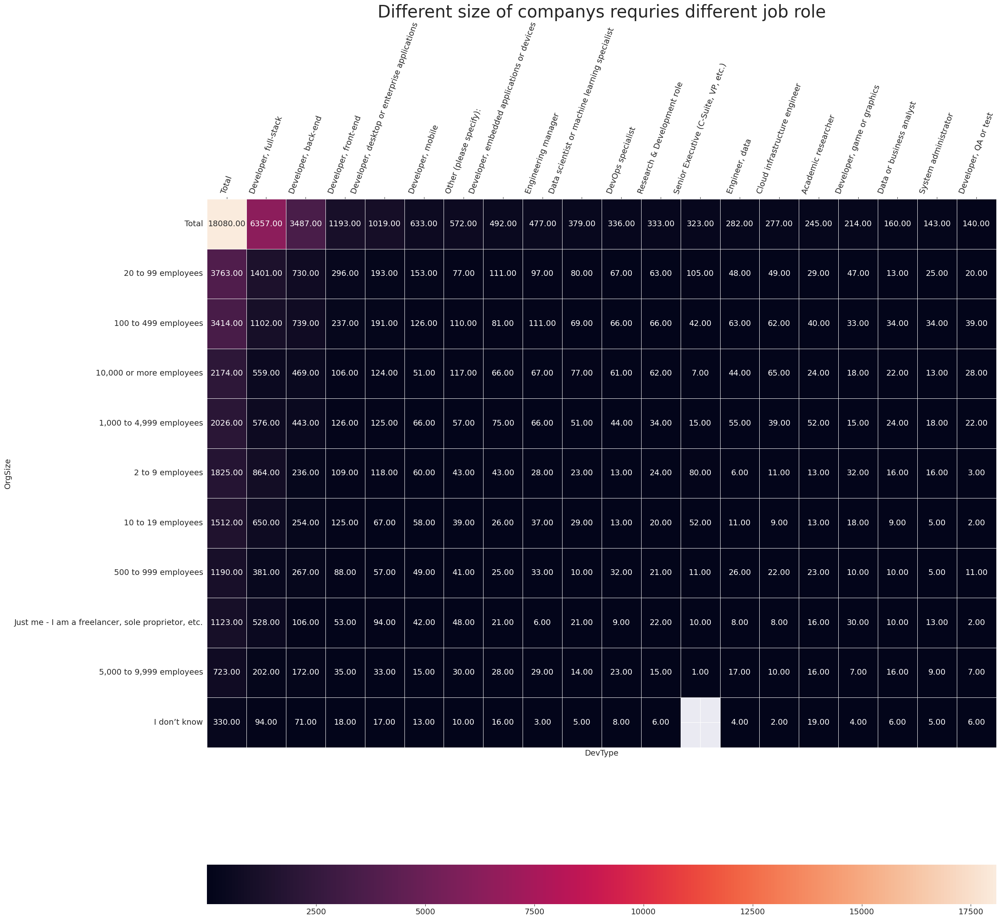

In [99]:
org_dev = survey_df.pivot_table(index='OrgSize', columns='DevType', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
org_dev = org_dev.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
org_dev = org_dev.iloc[:20, :20]

plt.figure(figsize=(25, 25))
plt.title("Different size of companys requries different job role", fontdict={'fontsize':30})
sns.heatmap(org_dev, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

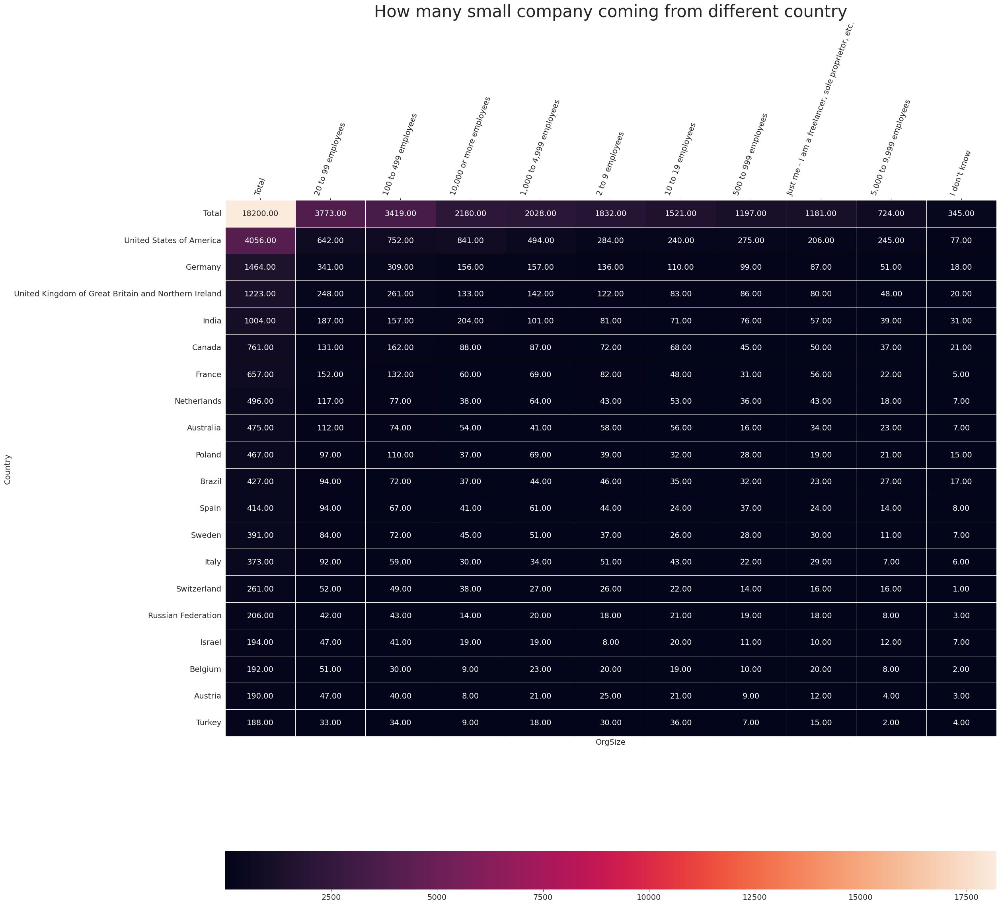

In [100]:
org_con = survey_df.pivot_table(index='Country', columns='OrgSize', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
org_con = org_con.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
org_con = org_con.iloc[:20, :20]

plt.figure(figsize=(25, 25))
plt.title("How many small company coming from different country", fontdict={'fontsize':30})
sns.heatmap(org_con, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

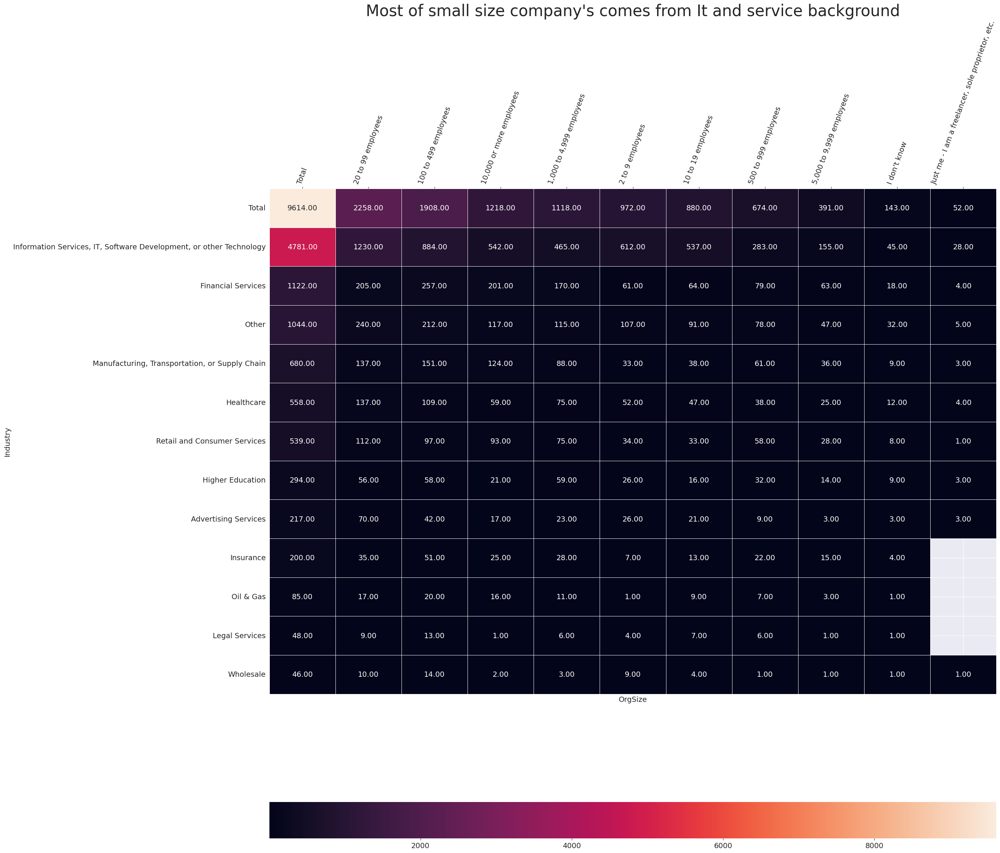

In [101]:
org_ind = survey_df.pivot_table(index='Industry', columns='OrgSize', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
org_ind = org_ind.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
org_ind = org_ind.iloc[:20, :20]

plt.figure(figsize=(25, 25))
plt.title("Most of small size company's comes from It and service background", fontdict={'fontsize':30})
sns.heatmap(org_ind, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

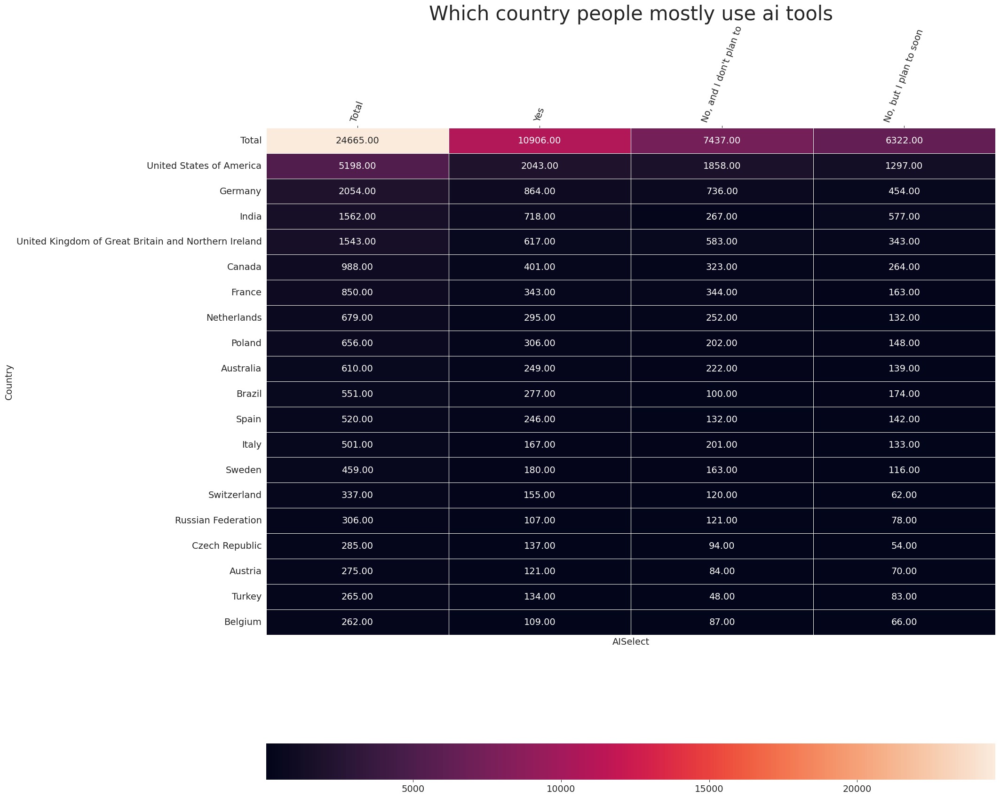

In [102]:
ai_con = survey_df.pivot_table(index='Country', columns='AISelect', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
ai_con = ai_con.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
ai_con = ai_con.iloc[:20, :20]

plt.figure(figsize=(20, 20))
plt.title("Which country people mostly use ai tools", fontdict={'fontsize':30})
sns.heatmap(ai_con, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();

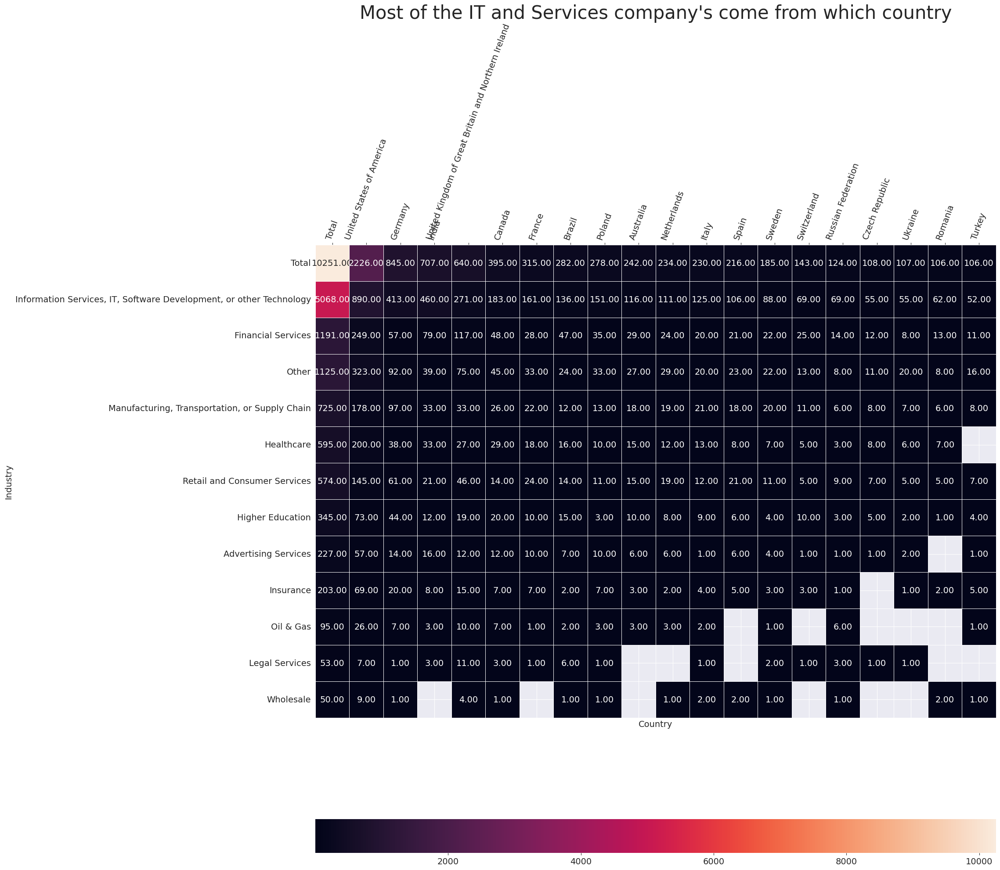

In [103]:
con_ind = survey_df.pivot_table(index='Industry', columns='Country', values='Numbers', aggfunc='count', margins=True, margins_name='Total')
con_ind = con_ind.sort_values(by='Total', axis=0, ascending=False).sort_values(by='Total', axis=1, ascending=False)
con_ind = con_ind.iloc[:20, :20]

plt.figure(figsize=(20, 20))
plt.title("Most of the IT and Services company's come from which country", fontdict={'fontsize':30})
sns.heatmap(con_ind, annot=True, fmt='.2f', linewidths=0.5, cbar_kws={'location': 'bottom'})
plt.tick_params(axis='x', which='both', bottom=False, top=True, labelbottom=False, labeltop=True)
plt.xticks(rotation=70)
plt.show();